# Generative Adversarial Networks (GANs)
So far in CS231N, all the applications of neural networks that we have explored have been **discriminative models** that take an input and are trained to produce a labeled output. This has ranged from straightforward classification of image categories to sentence generation (which was still phrased as a classification problem, our labels were in vocabulary space and we’d learned a recurrence to capture multi-word labels). In this notebook, we will expand our repetoire, and build **generative models** using neural networks. Specifically, we will learn how to build models which generate novel images that resemble a set of training images.

### What is a GAN?

In 2014, [Goodfellow et al.](https://arxiv.org/abs/1406.2661) presented a method for training generative models called Generative Adversarial Networks (GANs for short). In a GAN, we build two different neural networks. Our first network is a traditional classification network, called the **discriminator**. We will train the discriminator to take images, and classify them as being real (belonging to the training set) or fake (not present in the training set). Our other network, called the **generator**, will take random noise as input and transform it using a neural network to produce images. The goal of the generator is to fool the discriminator into thinking the images it produced are real.

We can think of this back and forth process of the generator ($G$) trying to fool the discriminator ($D$), and the discriminator trying to correctly classify real vs. fake as a minimax game:
$$\underset{G}{\text{minimize}}\; \underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
where $x \sim p_\text{data}$ are samples from the input data, $z \sim p(z)$ are the random noise samples, $G(z)$ are the generated images using the neural network generator $G$, and $D$ is the output of the discriminator, specifying the probability of an input being real. In [Goodfellow et al.](https://arxiv.org/abs/1406.2661), they analyze this minimax game and show how it relates to minimizing the Jensen-Shannon divergence between the training data distribution and the generated samples from $G$.

To optimize this minimax game, we will aternate between taking gradient *descent* steps on the objective for $G$, and gradient *ascent* steps on the objective for $D$:
1. update the **generator** ($G$) to minimize the probability of the __discriminator making the correct choice__. 
2. update the **discriminator** ($D$) to maximize the probability of the __discriminator making the correct choice__.

While these updates are useful for analysis, they do not perform well in practice. Instead, we will use a different objective when we update the generator: maximize the probability of the **discriminator making the incorrect choice**. This small change helps to allevaiate problems with the generator gradient vanishing when the discriminator is confident. This is the standard update used in most GAN papers, and was used in the original paper from [Goodfellow et al.](https://arxiv.org/abs/1406.2661). 

In this assignment, we will alternate the following updates:
1. Update the generator ($G$) to maximize the probability of the discriminator making the incorrect choice on generated data:
$$\underset{G}{\text{maximize}}\;  \mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
2. Update the discriminator ($D$), to maximize the probability of the discriminator making the correct choice on real and generated data:
$$\underset{D}{\text{maximize}}\; \mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] + \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$

### What else is there?
Since 2014, GANs have exploded into a huge research area, with massive [workshops](https://sites.google.com/site/nips2016adversarial/), and [hundreds of new papers](https://github.com/hindupuravinash/the-gan-zoo). Compared to other approaches for generative models, they often produce the highest quality samples but are some of the most difficult and finicky models to train (see [this github repo](https://github.com/soumith/ganhacks) that contains a set of 17 hacks that are useful for getting models working). Improving the stabiilty and robustness of GAN training is an open research question, with new papers coming out every day! For a more recent tutorial on GANs, see [here](https://arxiv.org/abs/1701.00160). There is also some even more recent exciting work that changes the objective function to Wasserstein distance and yields much more stable results across model architectures: [WGAN](https://arxiv.org/abs/1701.07875), [WGAN-GP](https://arxiv.org/abs/1704.00028).


GANs are not the only way to train a generative model! For other approaches to generative modeling check out the [deep generative model chapter](http://www.deeplearningbook.org/contents/generative_models.html) of the Deep Learning [book](http://www.deeplearningbook.org). Another popular way of training neural networks as generative models is Variational Autoencoders (co-discovered [here](https://arxiv.org/abs/1312.6114) and [here](https://arxiv.org/abs/1401.4082)). Variational autoencoders combine neural networks with variational inference to train deep generative models. These models tend to be far more stable and easier to train but currently don't produce samples that are as pretty as GANs.

Example pictures of what you should expect (yours might look slightly different):

![caption](gan_outputs_tf.png)


## Setup

In [1]:
import tensorflow as tf
import numpy as np
import os

import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec

%matplotlib inline
plt.rcParams['figure.figsize'] = (10.0, 8.0) # set default size of plots
plt.rcParams['image.interpolation'] = 'nearest'
plt.rcParams['image.cmap'] = 'gray'

# A bunch of utility functions

def show_images(images):
    images = np.reshape(images, [images.shape[0], -1])  # images reshape to (batch_size, D)
    sqrtn = int(np.ceil(np.sqrt(images.shape[0])))
    sqrtimg = int(np.ceil(np.sqrt(images.shape[1])))

    fig = plt.figure(figsize=(sqrtn, sqrtn))
    gs = gridspec.GridSpec(sqrtn, sqrtn)
    gs.update(wspace=0.05, hspace=0.05)

    for i, img in enumerate(images):
        ax = plt.subplot(gs[i])
        plt.axis('off')
        ax.set_xticklabels([])
        ax.set_yticklabels([])
        ax.set_aspect('equal')
        plt.imshow(img.reshape([sqrtimg,sqrtimg]))
    return

def preprocess_img(x):
    return 2 * x - 1.0

def deprocess_img(x):
    return (x + 1.0) / 2.0

def rel_error(x,y):
    return np.max(np.abs(x - y) / (np.maximum(1e-8, np.abs(x) + np.abs(y))))

def count_params(model):
    """Count the number of parameters in the current TensorFlow graph """
    param_count = np.sum([np.prod(p.shape) for p in model.weights])
    return param_count

answers = np.load('gan-checks-tf.npz')

NOISE_DIM = 96

## Dataset
 GANs are notoriously finicky with hyperparameters, and also require many training epochs. In order to make this assignment approachable without a GPU, we will be working on the MNIST dataset, which is 60,000 training and 10,000 test images. Each picture contains a centered image of white digit on black background (0 through 9). This was one of the first datasets used to train convolutional neural networks and it is fairly easy -- a standard CNN model can easily exceed 99% accuracy. 
 

**Heads-up**: Our MNIST wrapper returns images as vectors. That is, they're size (batch, 784). If you want to treat them as images, we have to resize them to (batch,28,28) or (batch,28,28,1). They are also type np.float32 and bounded [0,1]. 

In [2]:
class MNIST(object):
    def __init__(self, batch_size, shuffle=False):
        """
        Construct an iterator object over the MNIST data
        
        Inputs:
        - batch_size: Integer giving number of elements per minibatch
        - shuffle: (optional) Boolean, whether to shuffle the data on each epoch
        """
        train, _ = tf.keras.datasets.mnist.load_data()
        X, y = train
        X = X.astype(np.float32)/255
        X = X.reshape((X.shape[0], -1))
        self.X, self.y = X, y
        self.batch_size, self.shuffle = batch_size, shuffle

    def __iter__(self):
        N, B = self.X.shape[0], self.batch_size
        idxs = np.arange(N)
        if self.shuffle:
            np.random.shuffle(idxs)
        return iter((self.X[i:i+B], self.y[i:i+B]) for i in range(0, N, B)) 

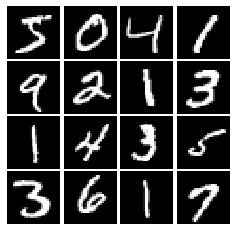

In [3]:
# show a batch
mnist = MNIST(batch_size=16) 
show_images(mnist.X[:16])

## LeakyReLU
In the cell below, you should implement a LeakyReLU. See the [class notes](http://cs231n.github.io/neural-networks-1/) (where alpha is small number) or equation (3) in [this paper](http://ai.stanford.edu/~amaas/papers/relu_hybrid_icml2013_final.pdf). LeakyReLUs keep ReLU units from dying and are often used in GAN methods (as are maxout units, however those increase model size and therefore are not used in this notebook).

HINT: You should be able to use `tf.maximum`

In [4]:
def leaky_relu(x, alpha=0.01):
    """Compute the leaky ReLU activation function.
    
    Inputs:
    - x: TensorFlow Tensor with arbitrary shape
    - alpha: leak parameter for leaky ReLU
    
    Returns:
    TensorFlow Tensor with the same shape as x
    """
    # TODO: implement leaky ReLU
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.nn.leaky_relu(x, alpha)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Test your leaky ReLU implementation. You should get errors < 1e-10

In [5]:
def test_leaky_relu(x, y_true):
    y = leaky_relu(tf.constant(x))
    print('Maximum error: %g'%rel_error(y_true, y))

test_leaky_relu(answers['lrelu_x'], answers['lrelu_y'])

Maximum error: 1.11759e-08


## Random Noise
Generate a TensorFlow `Tensor` containing uniform noise from -1 to 1 with shape `[batch_size, dim]`.

In [6]:
def sample_noise(batch_size, dim):
    """Generate random uniform noise from -1 to 1.
    
    Inputs:
    - batch_size: integer giving the batch size of noise to generate
    - dim: integer giving the dimension of the noise to generate
    
    Returns:
    TensorFlow Tensor containing uniform noise in [-1, 1] with shape [batch_size, dim]
    """
    # TODO: sample and return noise
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    return tf.random.uniform([batch_size, dim], minval=-1, maxval=1)

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****


Make sure noise is the correct shape and type:

In [7]:
def test_sample_noise():
    batch_size = 3
    dim = 4
    z = sample_noise(batch_size, dim)
    # Check z has the correct shape
    assert z.get_shape().as_list() == [batch_size, dim]
    # Make sure z is a Tensor and not a numpy array
    assert isinstance(z, tf.Tensor)
    # Check that we get different noise for different evaluations
    z1 = sample_noise(batch_size, dim)
    z2 = sample_noise(batch_size, dim)
    assert not np.array_equal(z1, z2)
    # Check that we get the correct range
    assert np.all(z1 >= -1.0) and np.all(z1 <= 1.0)
    print("All tests passed!")
    
test_sample_noise()

All tests passed!


## Discriminator
Our first step is to build a discriminator. **Hint:** You should use the layers in `tf.keras.layers` to build the model.
All fully connected layers should include bias terms. For initialization, just use the default initializer used by the `tf.keras.layers` functions.

Architecture:
 * Fully connected layer with input size 784 and output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 256
 * LeakyReLU with alpha 0.01
 * Fully connected layer with output size 1 
 
The output of the discriminator should thus have shape `[batch_size, 1]`, and contain real numbers corresponding to the scores that each of the `batch_size` inputs is a real image.

In [8]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(256),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the discriminator is correct:

In [9]:
def test_discriminator(true_count=267009):
    model = discriminator()
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in discriminator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in discriminator.')
        
test_discriminator()

Correct number of parameters in discriminator.


## Generator
Now to build a generator. You should use the layers in `tf.keras.layers` to construct the model. All fully connected layers should include bias terms. Note that you can use the tf.nn module to access activation functions. Once again, use the default initializers for parameters.

Architecture:
 * Fully connected layer with inupt size tf.shape(z)[1] (the number of noise dimensions) and output size 1024
 * `ReLU`
 * Fully connected layer with output size 1024 
 * `ReLU`
 * Fully connected layer with output size 784
 * `TanH` (To restrict every element of the output to be in the range [-1,1])

In [10]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(1024,activation='relu'),
        tf.keras.layers.Dense(784, activation='tanh')
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

Test to make sure the number of parameters in the generator is correct:

In [11]:
def test_generator(true_count=1858320):
    model = generator(4)
    cur_count = count_params(model)
    if cur_count != true_count:
        print('Incorrect number of parameters in generator. {0} instead of {1}. Check your achitecture.'.format(cur_count,true_count))
    else:
        print('Correct number of parameters in generator.')
        
test_generator()

Correct number of parameters in generator.


# GAN Loss

Compute the generator and discriminator loss. The generator loss is:
$$\ell_G  =  -\mathbb{E}_{z \sim p(z)}\left[\log D(G(z))\right]$$
and the discriminator loss is:
$$ \ell_D = -\mathbb{E}_{x \sim p_\text{data}}\left[\log D(x)\right] - \mathbb{E}_{z \sim p(z)}\left[\log \left(1-D(G(z))\right)\right]$$
Note that these are negated from the equations presented earlier as we will be *minimizing* these losses.

**HINTS**: Use [tf.ones](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/ones) and [tf.zeros](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/zeros) to generate labels for your discriminator. Use [tf.keras.losses.BinaryCrossentropy](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/losses/BinaryCrossentropy) to help compute your loss function.

In [12]:
def discriminator_loss(logits_real, logits_fake):
    """
    Computes the discriminator loss described above.
    
    Inputs:
    - logits_real: Tensor of shape (N, 1) giving scores for the real data.
    - logits_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Returns:
    - loss: Tensor containing (scalar) the loss for the discriminator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    real_loss = cross_entropy(tf.ones_like(logits_real), logits_real)

    fake_loss = cross_entropy(tf.zeros_like(logits_fake), logits_fake)
    loss = real_loss + fake_loss
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def generator_loss(logits_fake):
    """
    Computes the generator loss described above.

    Inputs:
    - logits_fake: PyTorch Tensor of shape (N,) giving scores for the fake data.
    
    Returns:
    - loss: PyTorch Tensor containing the (scalar) loss for the generator.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    cross_entropy = tf.keras.losses.BinaryCrossentropy(from_logits=True)
    loss = cross_entropy(tf.ones_like(logits_fake), logits_fake)
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your GAN loss. Make sure both the generator and discriminator loss are correct. You should see errors less than 1e-8.

In [13]:
def test_discriminator_loss(logits_real, logits_fake, d_loss_true):
    d_loss = discriminator_loss(tf.constant(logits_real),
                                tf.constant(logits_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))

test_discriminator_loss(answers['logits_real'], answers['logits_fake'],
                        answers['d_loss_true'])

Maximum error in d_loss: 3.97058e-09


In [14]:
def test_generator_loss(logits_fake, g_loss_true):
    g_loss = generator_loss(tf.constant(logits_fake))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_generator_loss(answers['logits_fake'], answers['g_loss_true'])

Maximum error in g_loss: 4.4518e-09


# Optimizing our loss
Make an `Adam` optimizer with a 1e-3 learning rate, beta1=0.5 to mininize G_loss and D_loss separately. The trick of decreasing beta was shown to be effective in helping GANs converge in the [Improved Techniques for Training GANs](https://arxiv.org/abs/1606.03498) paper. In fact, with our current hyperparameters, if you set beta1 to the Tensorflow default of 0.9, there's a good chance your discriminator loss will go to zero and the generator will fail to learn entirely. In fact, this is a common failure mode in GANs; if your D(x) learns too fast (e.g. loss goes near zero), your G(z) is never able to learn. Often D(x) is trained with SGD with Momentum or RMSProp instead of Adam, but here we'll use Adam for both D(x) and G(z). 

In [15]:
# TODO: create an AdamOptimizer for D_solver and G_solver
def get_solvers(learning_rate=1e-3, beta1=0.5):
    """Create solvers for GAN training.
    
    Inputs:
    - learning_rate: learning rate to use for both solvers
    - beta1: beta1 parameter for both solvers (first moment decay)
    
    Returns:
    - D_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    - G_solver: instance of tf.optimizers.Adam with correct learning_rate and beta1
    """
    D_solver = tf.optimizers.Adam(learning_rate,beta1)
    G_solver = tf.optimizers.Adam(learning_rate,beta1)
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    pass

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return D_solver, G_solver

# Training a GAN!
Well that wasn't so hard, was it? After the first epoch, you should see fuzzy outlines, clear shapes as you approach epoch 3, and decent shapes, about half of which will be sharp and clearly recognizable as we pass epoch 5. In our case, we'll simply train D(x) and G(z) with one batch each every iteration. However, papers often experiment with different schedules of training D(x) and G(z), sometimes doing one for more steps than the other, or even training each one until the loss gets "good enough" and then switching to training the other. 

In [16]:
# a giant helper function
def run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss,\
              show_every=20, print_every=20, batch_size=128, num_epochs=10, noise_size=96):
    """Train a GAN for a certain number of epochs.
    
    Inputs:
    - D: Discriminator model
    - G: Generator model
    - D_solver: an Optimizer for Discriminator
    - G_solver: an Optimizer for Generator
    - generator_loss: Generator loss
    - discriminator_loss: Discriminator loss
    Returns:
        Nothing
    """
    mnist = MNIST(batch_size=batch_size, shuffle=True)
    
    iter_count = 0
    for epoch in range(num_epochs):
        for (x, _) in mnist:
            with tf.GradientTape() as tape:
                real_data = x
                logits_real = D(preprocess_img(real_data))

                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)
                logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))

                d_total_error = discriminator_loss(logits_real, logits_fake)
                d_gradients = tape.gradient(d_total_error, D.trainable_variables)      
                D_solver.apply_gradients(zip(d_gradients, D.trainable_variables))
            
            with tf.GradientTape() as tape:
                g_fake_seed = sample_noise(batch_size, noise_size)
                fake_images = G(g_fake_seed)

                gen_logits_fake = D(tf.reshape(fake_images, [batch_size, 784]))
                g_error = generator_loss(gen_logits_fake)
                g_gradients = tape.gradient(g_error, G.trainable_variables)      
                G_solver.apply_gradients(zip(g_gradients, G.trainable_variables))

            if (iter_count % show_every == 0):
                print('Epoch: {}, Iter: {}, D: {:.4}, G:{:.4}'.format(epoch, iter_count,d_total_error,g_error))
                imgs_numpy = fake_images.cpu().numpy()
                show_images(imgs_numpy[0:16])
                plt.show()
            iter_count += 1
    
    # random noise fed into our generator
    z = sample_noise(batch_size, noise_size)
    # generated images
    G_sample = G(z)
    print('Final images')
    show_images(G_sample[:16])
    plt.show()

#### Train your GAN! This should take about 10 minutes on a CPU, or about 2 minutes on GPU.

Epoch: 0, Iter: 0, D: 1.574, G:0.714
Instructions for updating:
Use tf.identity instead.


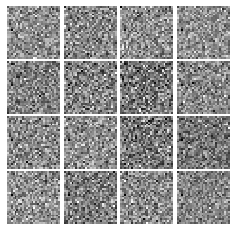

Epoch: 0, Iter: 20, D: 0.5931, G:0.9377


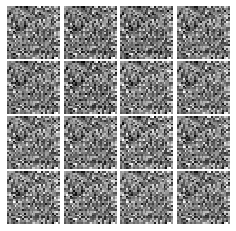

Epoch: 0, Iter: 40, D: 0.5418, G:1.039


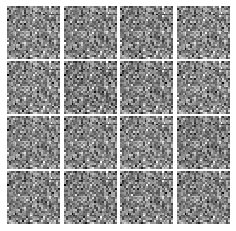

Epoch: 0, Iter: 60, D: 0.2348, G:2.589


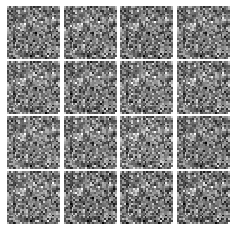

Epoch: 0, Iter: 80, D: 2.476, G:0.8368


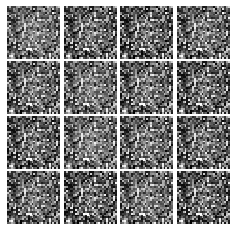

Epoch: 0, Iter: 100, D: 1.171, G:1.872


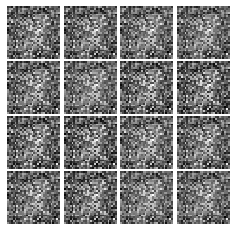

Epoch: 0, Iter: 120, D: 1.184, G:1.291


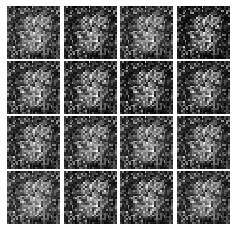

Epoch: 0, Iter: 140, D: 1.561, G:1.4


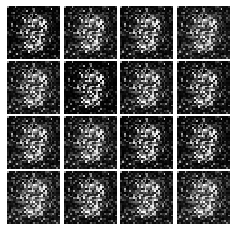

Epoch: 0, Iter: 160, D: 1.273, G:1.11


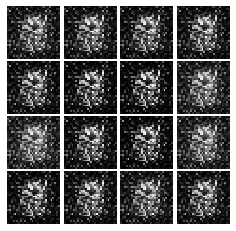

Epoch: 0, Iter: 180, D: 1.365, G:1.265


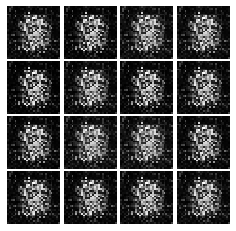

Epoch: 0, Iter: 200, D: 2.104, G:3.285


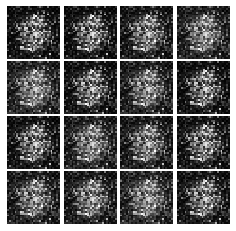

Epoch: 0, Iter: 220, D: 1.54, G:1.259


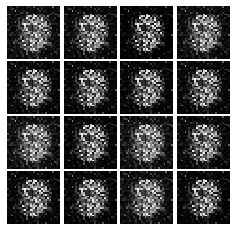

Epoch: 0, Iter: 240, D: 1.38, G:1.271


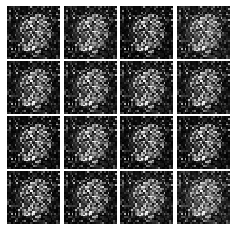

Epoch: 0, Iter: 260, D: 1.249, G:1.208


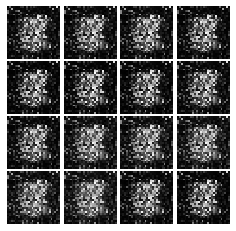

Epoch: 0, Iter: 280, D: 1.447, G:1.675


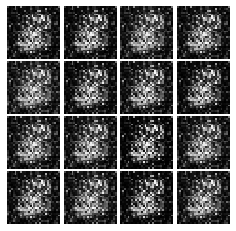

Epoch: 0, Iter: 300, D: 1.82, G:2.508


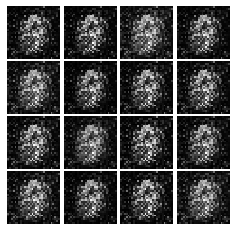

Epoch: 0, Iter: 320, D: 1.0, G:1.029


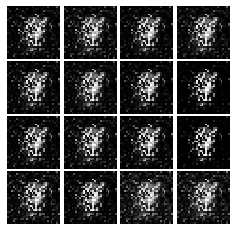

Epoch: 0, Iter: 340, D: 1.37, G:1.108


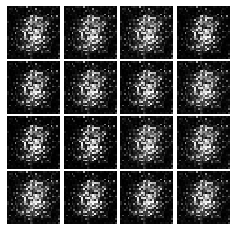

Epoch: 0, Iter: 360, D: 1.717, G:0.5924


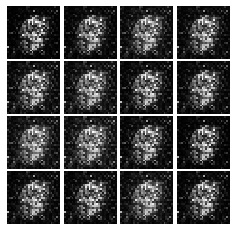

Epoch: 0, Iter: 380, D: 0.9678, G:1.091


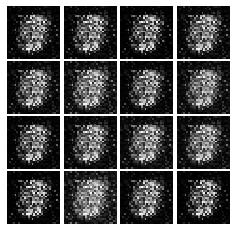

Epoch: 0, Iter: 400, D: 1.189, G:1.019


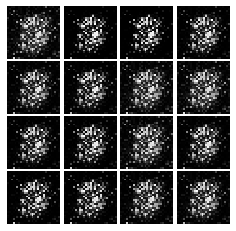

Epoch: 0, Iter: 420, D: 1.536, G:0.667


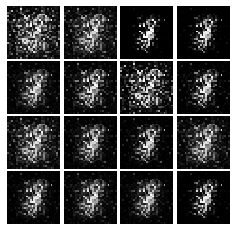

Epoch: 0, Iter: 440, D: 1.349, G:0.9634


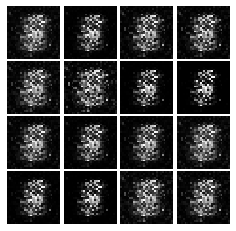

Epoch: 0, Iter: 460, D: 1.289, G:0.9547


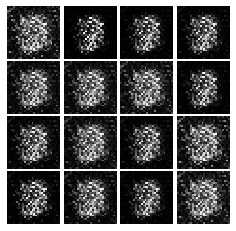

Epoch: 1, Iter: 480, D: 1.303, G:1.896


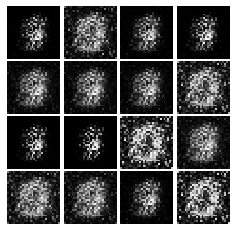

Epoch: 1, Iter: 500, D: 1.102, G:1.125


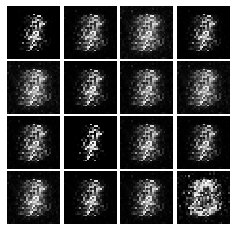

Epoch: 1, Iter: 520, D: 1.385, G:1.315


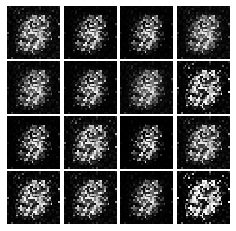

Epoch: 1, Iter: 540, D: 0.964, G:1.026


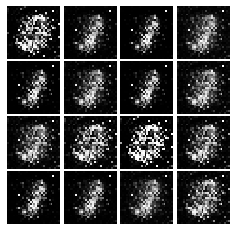

Epoch: 1, Iter: 560, D: 0.8989, G:1.497


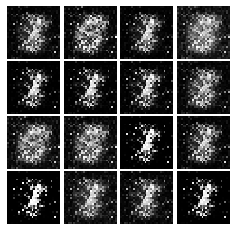

Epoch: 1, Iter: 580, D: 0.8027, G:1.386


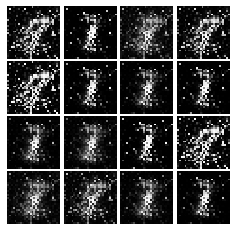

Epoch: 1, Iter: 600, D: 1.141, G:1.382


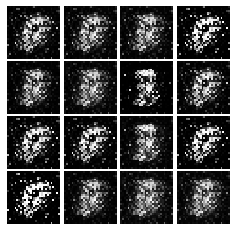

Epoch: 1, Iter: 620, D: 1.426, G:1.436


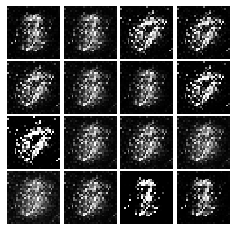

Epoch: 1, Iter: 640, D: 1.035, G:1.072


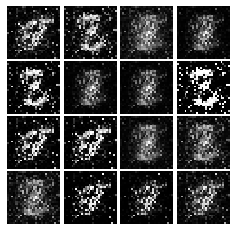

Epoch: 1, Iter: 660, D: 1.784, G:0.843


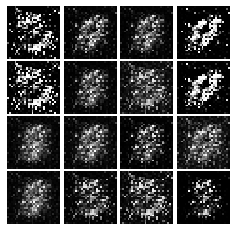

Epoch: 1, Iter: 680, D: 1.157, G:1.126


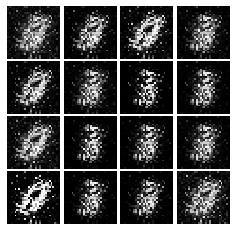

Epoch: 1, Iter: 700, D: 1.513, G:0.7969


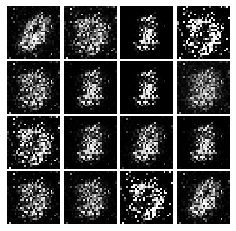

Epoch: 1, Iter: 720, D: 1.244, G:0.9782


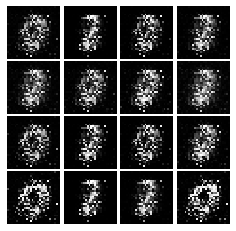

Epoch: 1, Iter: 740, D: 1.204, G:1.243


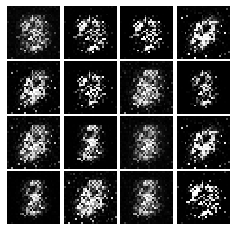

Epoch: 1, Iter: 760, D: 1.338, G:1.285


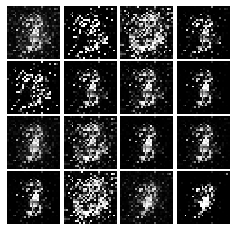

Epoch: 1, Iter: 780, D: 1.524, G:0.6892


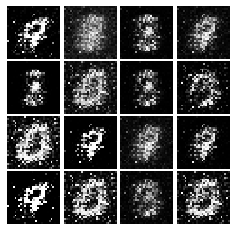

Epoch: 1, Iter: 800, D: 1.078, G:0.9974


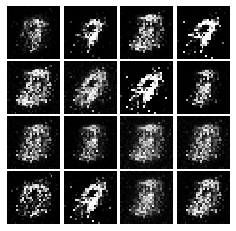

Epoch: 1, Iter: 820, D: 1.432, G:2.583


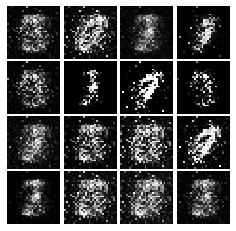

Epoch: 1, Iter: 840, D: 1.055, G:0.9732


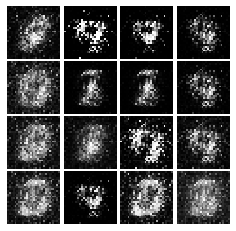

Epoch: 1, Iter: 860, D: 1.23, G:1.458


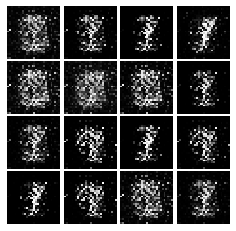

Epoch: 1, Iter: 880, D: 1.193, G:1.22


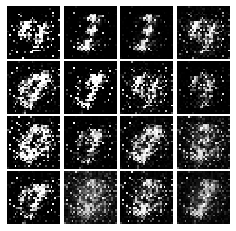

Epoch: 1, Iter: 900, D: 1.353, G:2.386


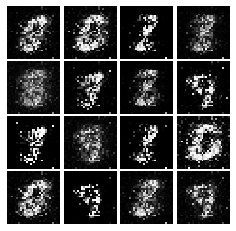

Epoch: 1, Iter: 920, D: 1.201, G:2.03


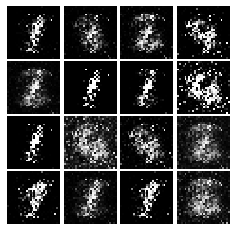

Epoch: 2, Iter: 940, D: 1.291, G:1.211


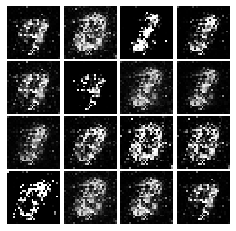

Epoch: 2, Iter: 960, D: 0.8516, G:1.641


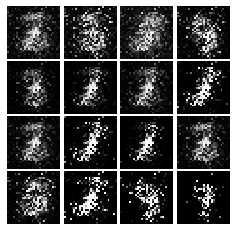

Epoch: 2, Iter: 980, D: 1.114, G:1.56


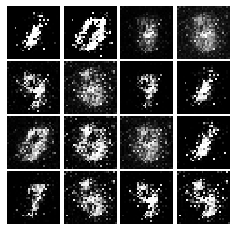

Epoch: 2, Iter: 1000, D: 1.179, G:1.207


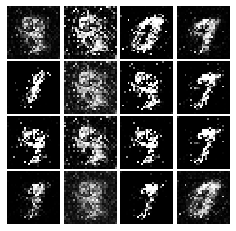

Epoch: 2, Iter: 1020, D: 1.179, G:1.116


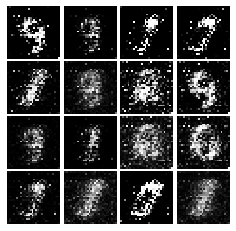

Epoch: 2, Iter: 1040, D: 1.207, G:1.384


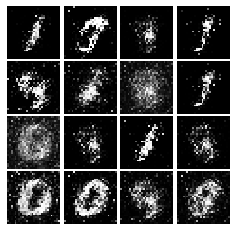

Epoch: 2, Iter: 1060, D: 1.41, G:1.256


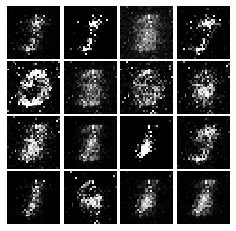

Epoch: 2, Iter: 1080, D: 1.106, G:1.037


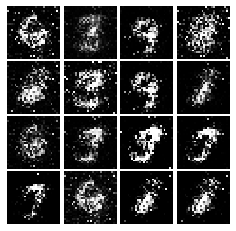

Epoch: 2, Iter: 1100, D: 1.547, G:2.699


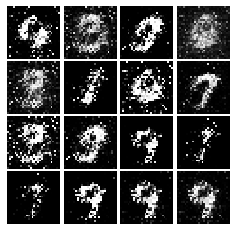

Epoch: 2, Iter: 1120, D: 1.285, G:1.083


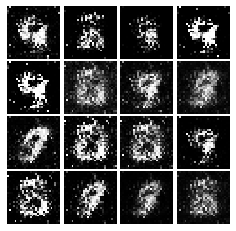

Epoch: 2, Iter: 1140, D: 1.161, G:2.631


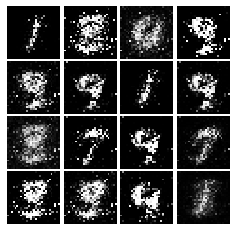

Epoch: 2, Iter: 1160, D: 1.207, G:1.032


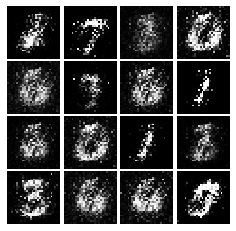

Epoch: 2, Iter: 1180, D: 1.138, G:1.213


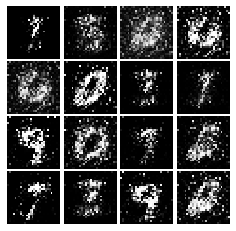

Epoch: 2, Iter: 1200, D: 1.433, G:0.9074


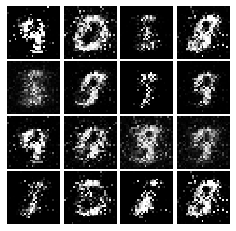

Epoch: 2, Iter: 1220, D: 1.293, G:0.9635


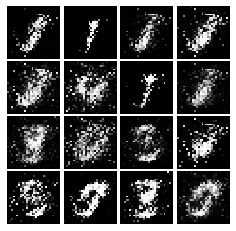

Epoch: 2, Iter: 1240, D: 1.296, G:1.021


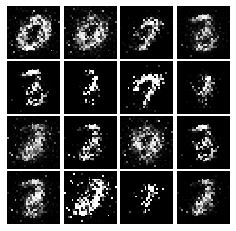

Epoch: 2, Iter: 1260, D: 1.338, G:1.154


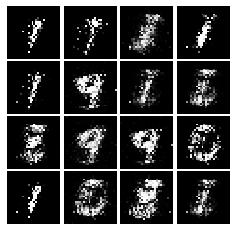

Epoch: 2, Iter: 1280, D: 1.34, G:0.968


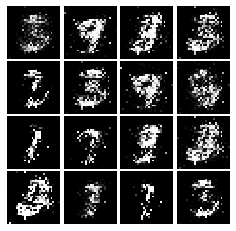

Epoch: 2, Iter: 1300, D: 1.176, G:1.098


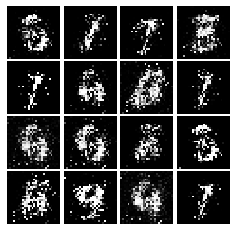

Epoch: 2, Iter: 1320, D: 1.278, G:1.15


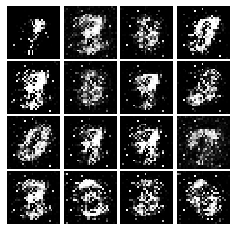

Epoch: 2, Iter: 1340, D: 1.306, G:1.001


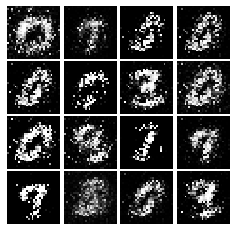

Epoch: 2, Iter: 1360, D: 1.244, G:0.7509


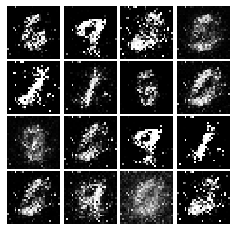

Epoch: 2, Iter: 1380, D: 1.354, G:0.8207


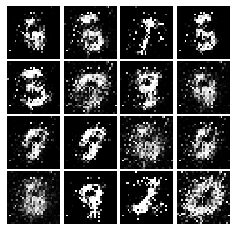

Epoch: 2, Iter: 1400, D: 1.121, G:1.499


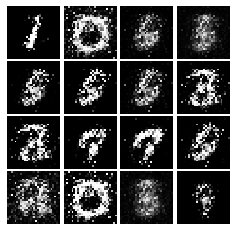

Epoch: 3, Iter: 1420, D: 1.156, G:0.9264


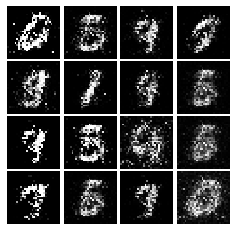

Epoch: 3, Iter: 1440, D: 1.112, G:1.157


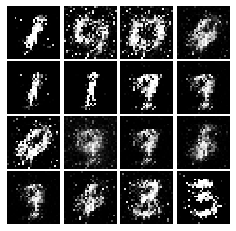

Epoch: 3, Iter: 1460, D: 1.275, G:0.9217


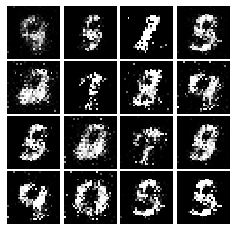

Epoch: 3, Iter: 1480, D: 1.149, G:1.146


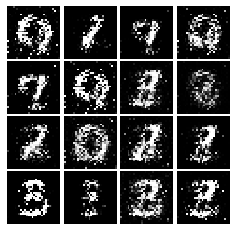

Epoch: 3, Iter: 1500, D: 1.208, G:0.948


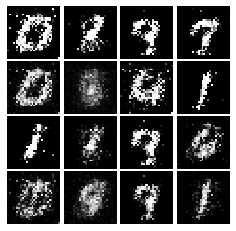

Epoch: 3, Iter: 1520, D: 1.211, G:0.9532


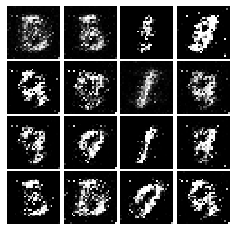

Epoch: 3, Iter: 1540, D: 1.403, G:0.5936


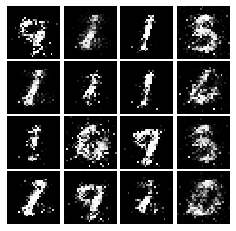

Epoch: 3, Iter: 1560, D: 1.185, G:0.9678


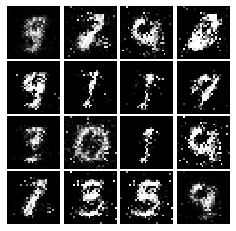

Epoch: 3, Iter: 1580, D: 1.208, G:1.04


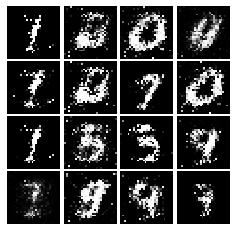

Epoch: 3, Iter: 1600, D: 1.283, G:2.208


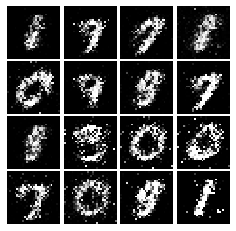

Epoch: 3, Iter: 1620, D: 1.216, G:0.8637


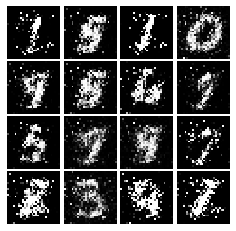

Epoch: 3, Iter: 1640, D: 1.257, G:0.8274


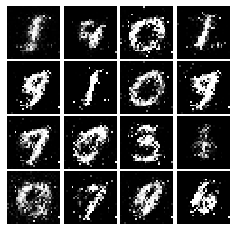

Epoch: 3, Iter: 1660, D: 1.135, G:1.149


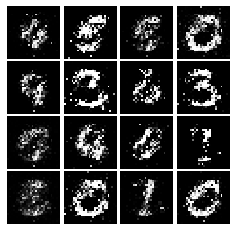

Epoch: 3, Iter: 1680, D: 1.18, G:1.033


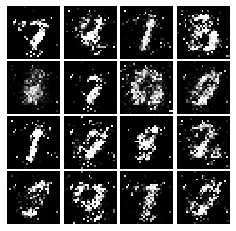

Epoch: 3, Iter: 1700, D: 1.2, G:0.9528


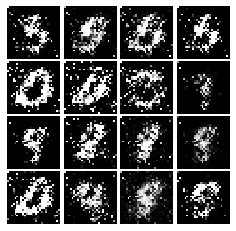

Epoch: 3, Iter: 1720, D: 1.56, G:0.8636


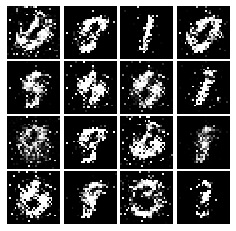

Epoch: 3, Iter: 1740, D: 1.136, G:0.6444


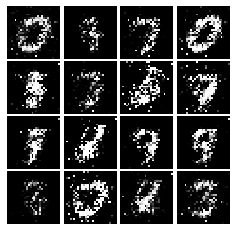

Epoch: 3, Iter: 1760, D: 1.001, G:1.302


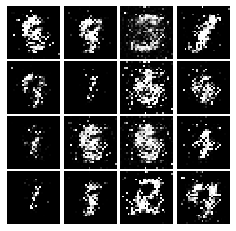

Epoch: 3, Iter: 1780, D: 1.002, G:1.251


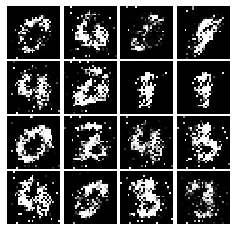

Epoch: 3, Iter: 1800, D: 1.25, G:1.122


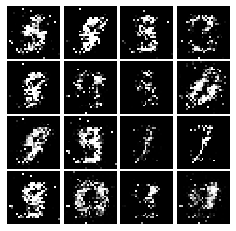

Epoch: 3, Iter: 1820, D: 1.273, G:1.066


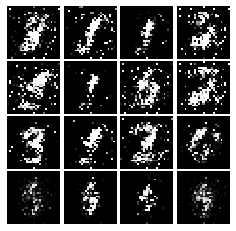

Epoch: 3, Iter: 1840, D: 1.222, G:0.9982


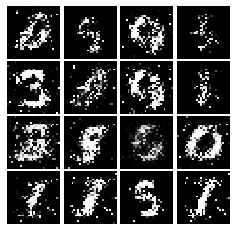

Epoch: 3, Iter: 1860, D: 1.315, G:1.072


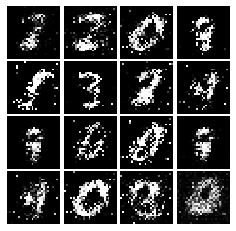

Epoch: 4, Iter: 1880, D: 1.335, G:0.9358


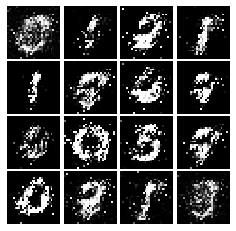

Epoch: 4, Iter: 1900, D: 1.157, G:1.107


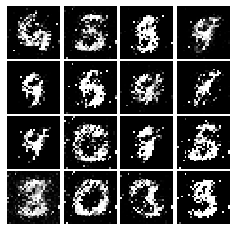

Epoch: 4, Iter: 1920, D: 1.133, G:1.137


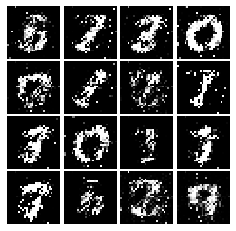

Epoch: 4, Iter: 1940, D: 1.12, G:0.9858


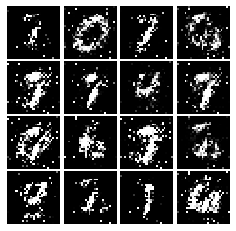

Epoch: 4, Iter: 1960, D: 1.966, G:0.6001


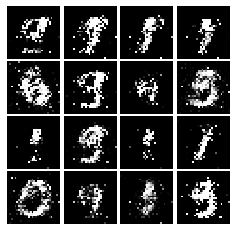

Epoch: 4, Iter: 1980, D: 1.22, G:1.031


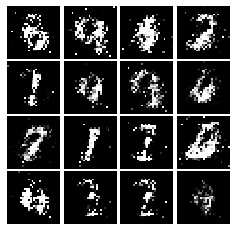

Epoch: 4, Iter: 2000, D: 1.528, G:0.5279


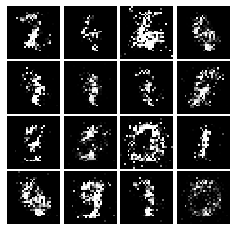

Epoch: 4, Iter: 2020, D: 1.192, G:1.342


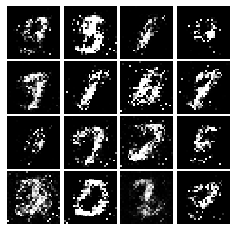

Epoch: 4, Iter: 2040, D: 1.363, G:0.8665


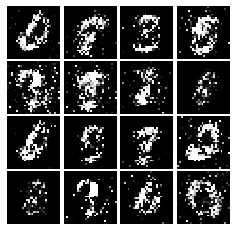

Epoch: 4, Iter: 2060, D: 1.353, G:0.922


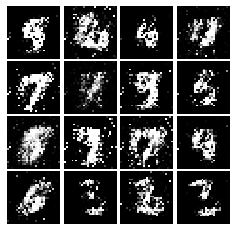

Epoch: 4, Iter: 2080, D: 1.189, G:1.213


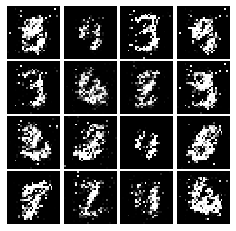

Epoch: 4, Iter: 2100, D: 1.475, G:1.076


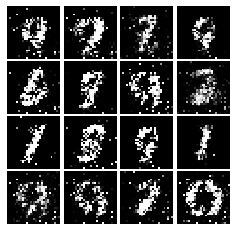

Epoch: 4, Iter: 2120, D: 1.321, G:0.791


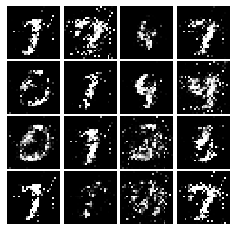

Epoch: 4, Iter: 2140, D: 1.237, G:1.074


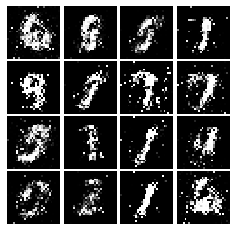

Epoch: 4, Iter: 2160, D: 1.54, G:0.8882


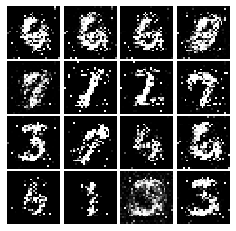

Epoch: 4, Iter: 2180, D: 1.229, G:1.145


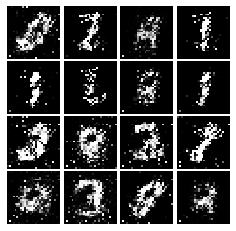

Epoch: 4, Iter: 2200, D: 1.122, G:1.041


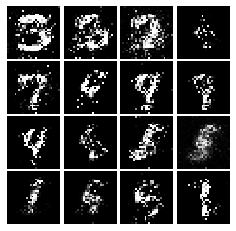

Epoch: 4, Iter: 2220, D: 1.209, G:1.092


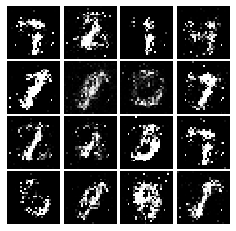

Epoch: 4, Iter: 2240, D: 1.359, G:1.199


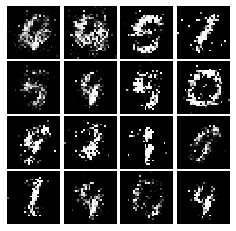

Epoch: 4, Iter: 2260, D: 1.321, G:0.9806


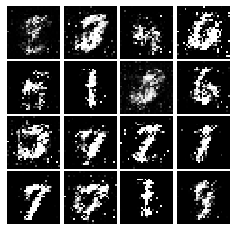

Epoch: 4, Iter: 2280, D: 1.453, G:0.6676


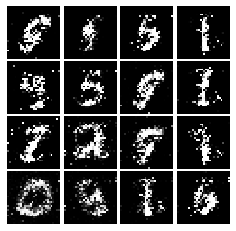

Epoch: 4, Iter: 2300, D: 1.207, G:0.9132


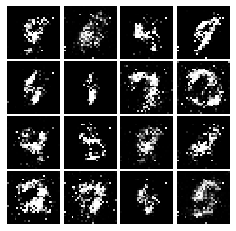

Epoch: 4, Iter: 2320, D: 1.479, G:0.8013


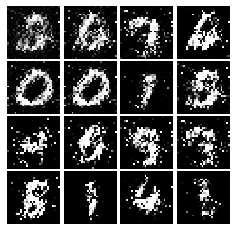

Epoch: 4, Iter: 2340, D: 1.103, G:1.051


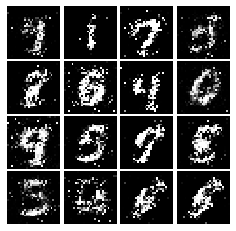

Epoch: 5, Iter: 2360, D: 1.377, G:0.193


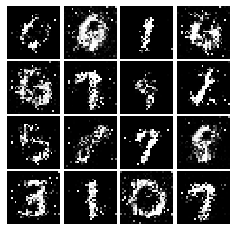

Epoch: 5, Iter: 2380, D: 1.279, G:0.9347


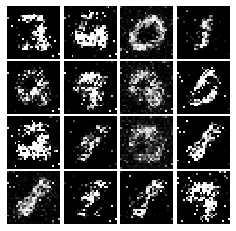

Epoch: 5, Iter: 2400, D: 1.282, G:1.07


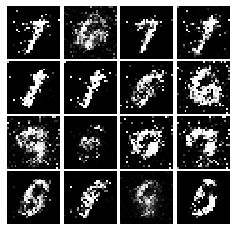

Epoch: 5, Iter: 2420, D: 1.186, G:1.421


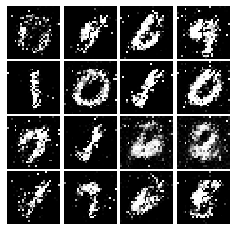

Epoch: 5, Iter: 2440, D: 1.255, G:1.062


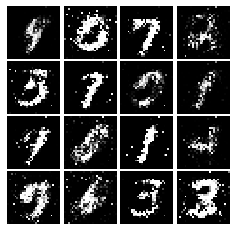

Epoch: 5, Iter: 2460, D: 1.154, G:1.171


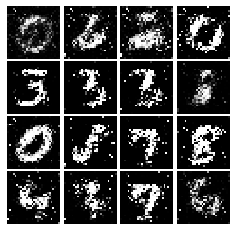

Epoch: 5, Iter: 2480, D: 1.235, G:0.9901


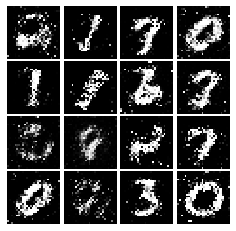

Epoch: 5, Iter: 2500, D: 1.086, G:1.038


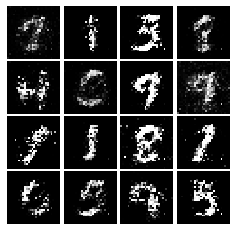

Epoch: 5, Iter: 2520, D: 1.351, G:0.8434


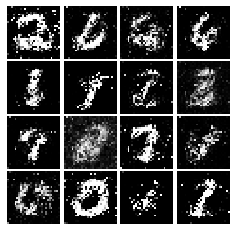

Epoch: 5, Iter: 2540, D: 1.33, G:0.9154


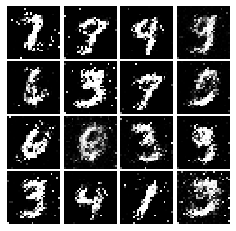

Epoch: 5, Iter: 2560, D: 1.364, G:0.8532


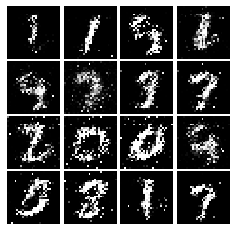

Epoch: 5, Iter: 2580, D: 1.307, G:0.8698


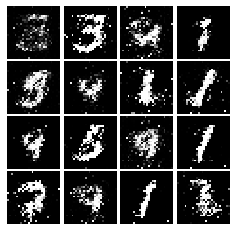

Epoch: 5, Iter: 2600, D: 1.539, G:0.7242


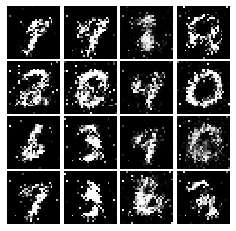

Epoch: 5, Iter: 2620, D: 1.403, G:0.783


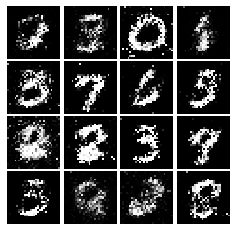

Epoch: 5, Iter: 2640, D: 1.342, G:0.8615


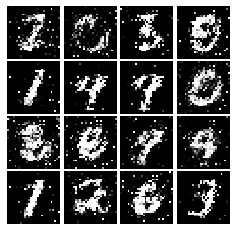

Epoch: 5, Iter: 2660, D: 1.449, G:0.7051


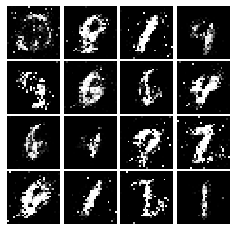

Epoch: 5, Iter: 2680, D: 1.385, G:0.755


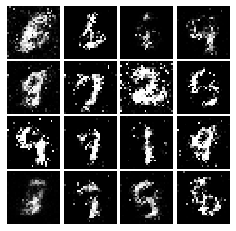

Epoch: 5, Iter: 2700, D: 1.328, G:0.8021


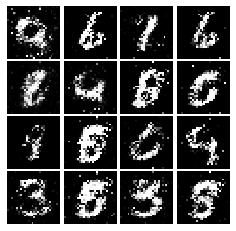

Epoch: 5, Iter: 2720, D: 1.216, G:0.7684


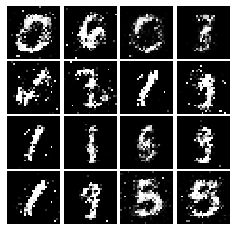

Epoch: 5, Iter: 2740, D: 1.355, G:0.9963


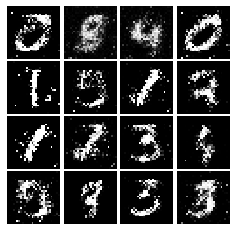

Epoch: 5, Iter: 2760, D: 1.279, G:0.9451


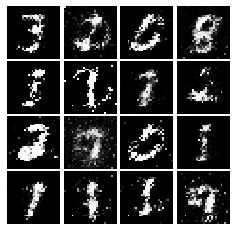

Epoch: 5, Iter: 2780, D: 1.305, G:0.7702


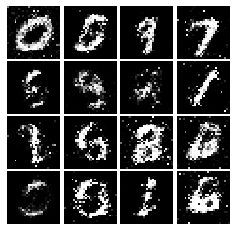

Epoch: 5, Iter: 2800, D: 1.298, G:0.8396


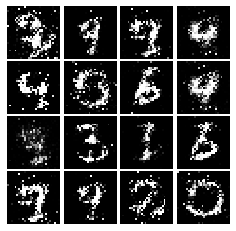

Epoch: 6, Iter: 2820, D: 1.316, G:0.77


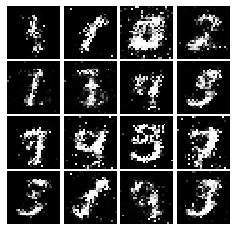

Epoch: 6, Iter: 2840, D: 1.25, G:0.8373


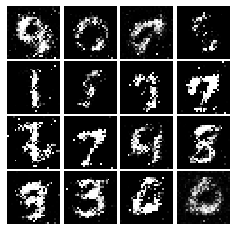

Epoch: 6, Iter: 2860, D: 1.38, G:0.947


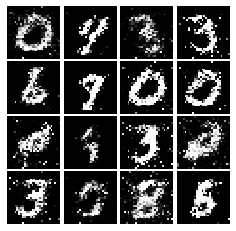

Epoch: 6, Iter: 2880, D: 1.18, G:1.013


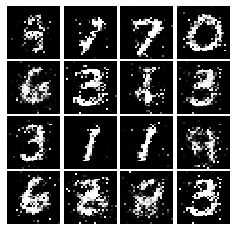

Epoch: 6, Iter: 2900, D: 1.334, G:0.8023


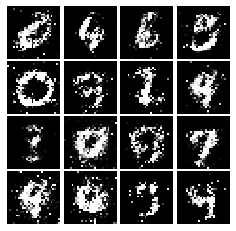

Epoch: 6, Iter: 2920, D: 1.315, G:0.7778


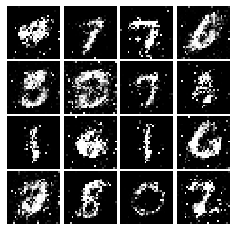

Epoch: 6, Iter: 2940, D: 1.379, G:0.7344


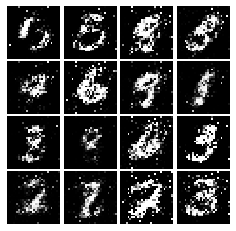

Epoch: 6, Iter: 2960, D: 1.387, G:0.7376


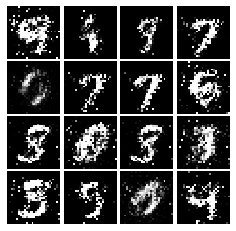

Epoch: 6, Iter: 2980, D: 1.432, G:0.7917


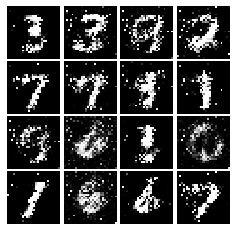

Epoch: 6, Iter: 3000, D: 1.34, G:0.8893


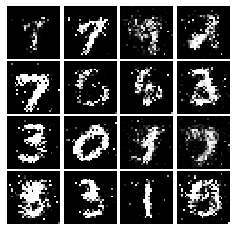

Epoch: 6, Iter: 3020, D: 1.278, G:0.8914


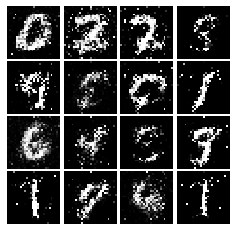

Epoch: 6, Iter: 3040, D: 1.45, G:0.7438


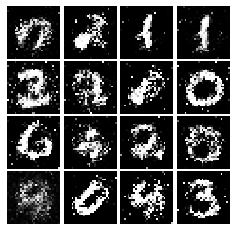

Epoch: 6, Iter: 3060, D: 1.304, G:0.7927


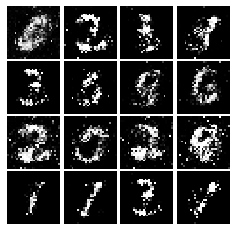

Epoch: 6, Iter: 3080, D: 1.334, G:0.7035


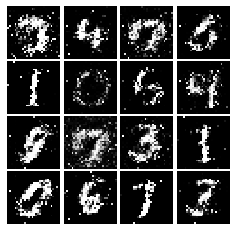

Epoch: 6, Iter: 3100, D: 1.381, G:0.7722


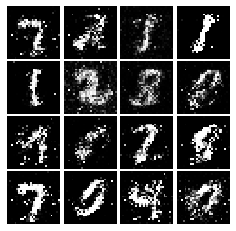

Epoch: 6, Iter: 3120, D: 1.26, G:0.801


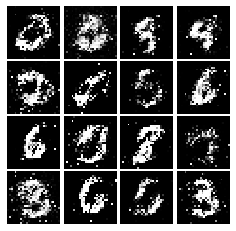

Epoch: 6, Iter: 3140, D: 1.377, G:0.8376


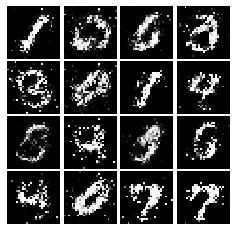

Epoch: 6, Iter: 3160, D: 1.307, G:0.8315


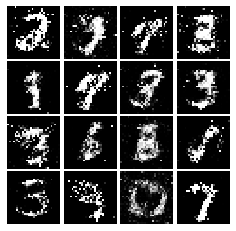

Epoch: 6, Iter: 3180, D: 1.346, G:0.909


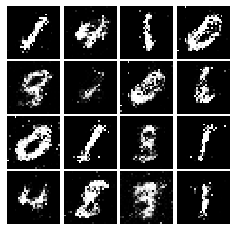

Epoch: 6, Iter: 3200, D: 1.389, G:0.8243


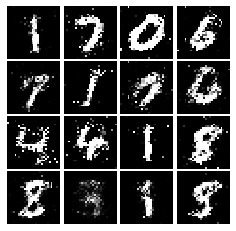

Epoch: 6, Iter: 3220, D: 1.369, G:0.8017


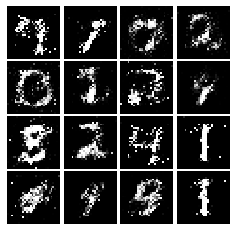

Epoch: 6, Iter: 3240, D: 1.341, G:0.7725


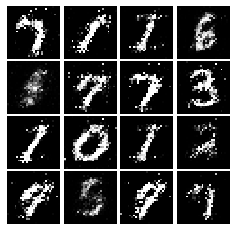

Epoch: 6, Iter: 3260, D: 1.401, G:0.8532


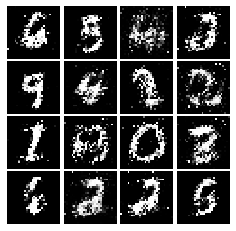

Epoch: 6, Iter: 3280, D: 1.375, G:0.7665


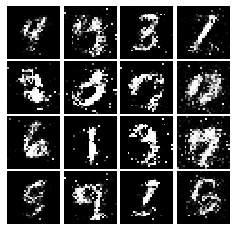

Epoch: 7, Iter: 3300, D: 1.317, G:0.8171


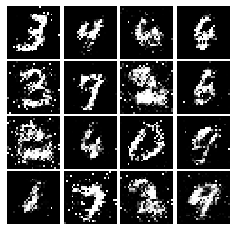

Epoch: 7, Iter: 3320, D: 1.341, G:0.8111


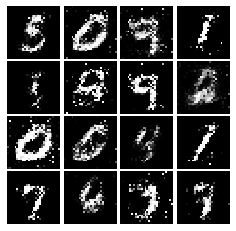

Epoch: 7, Iter: 3340, D: 1.314, G:0.8425


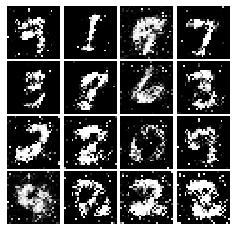

Epoch: 7, Iter: 3360, D: 1.324, G:0.8294


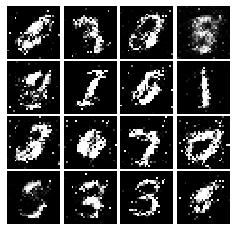

Epoch: 7, Iter: 3380, D: 1.433, G:0.8041


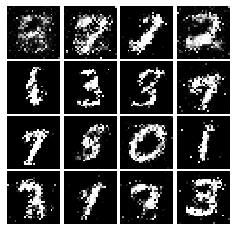

Epoch: 7, Iter: 3400, D: 1.423, G:0.8515


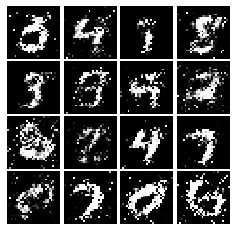

Epoch: 7, Iter: 3420, D: 1.334, G:0.3895


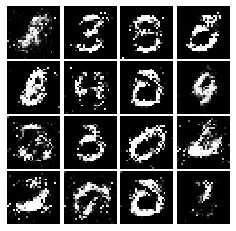

Epoch: 7, Iter: 3440, D: 1.295, G:0.7406


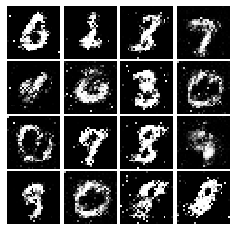

Epoch: 7, Iter: 3460, D: 1.368, G:0.7798


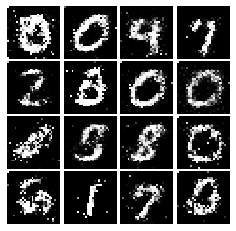

Epoch: 7, Iter: 3480, D: 1.409, G:0.7275


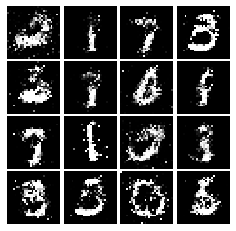

Epoch: 7, Iter: 3500, D: 1.329, G:0.8404


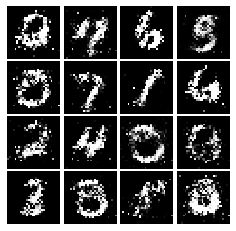

Epoch: 7, Iter: 3520, D: 1.344, G:0.7704


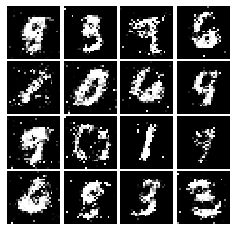

Epoch: 7, Iter: 3540, D: 1.238, G:0.7762


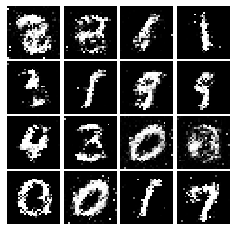

Epoch: 7, Iter: 3560, D: 1.382, G:0.86


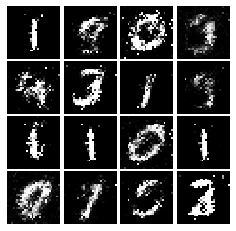

Epoch: 7, Iter: 3580, D: 1.341, G:0.7702


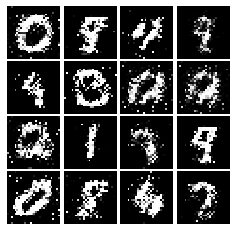

Epoch: 7, Iter: 3600, D: 1.352, G:0.8766


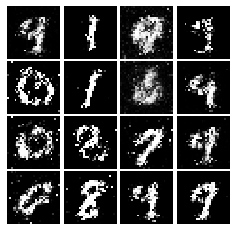

Epoch: 7, Iter: 3620, D: 1.316, G:0.8231


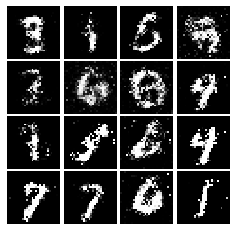

Epoch: 7, Iter: 3640, D: 1.379, G:0.7933


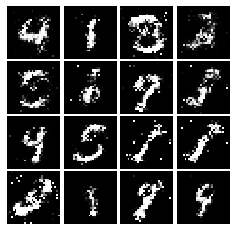

Epoch: 7, Iter: 3660, D: 1.404, G:0.7398


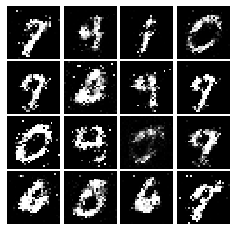

Epoch: 7, Iter: 3680, D: 1.265, G:0.7967


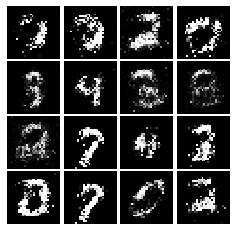

Epoch: 7, Iter: 3700, D: 1.374, G:0.7927


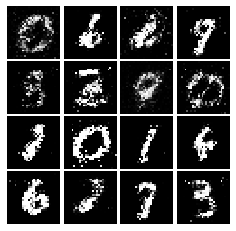

Epoch: 7, Iter: 3720, D: 1.31, G:0.846


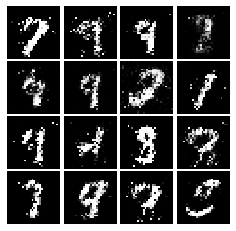

Epoch: 7, Iter: 3740, D: 1.369, G:0.7357


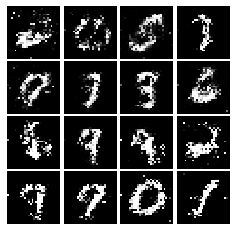

Epoch: 8, Iter: 3760, D: 1.357, G:0.8293


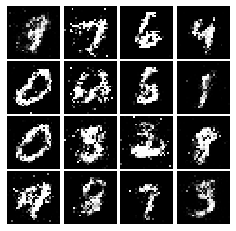

Epoch: 8, Iter: 3780, D: 1.319, G:0.7844


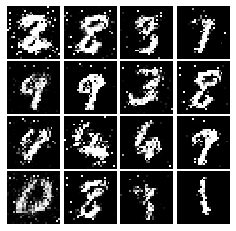

Epoch: 8, Iter: 3800, D: 1.387, G:1.033


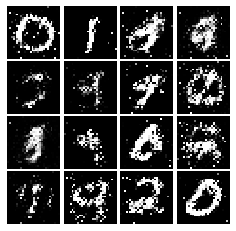

Epoch: 8, Iter: 3820, D: 1.281, G:0.8264


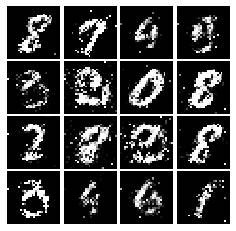

Epoch: 8, Iter: 3840, D: 1.352, G:0.8073


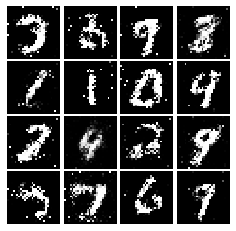

Epoch: 8, Iter: 3860, D: 1.187, G:0.8194


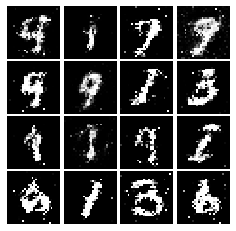

Epoch: 8, Iter: 3880, D: 1.29, G:0.8478


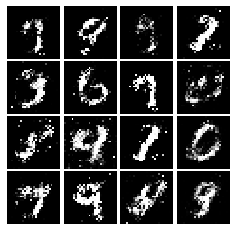

Epoch: 8, Iter: 3900, D: 1.398, G:0.7242


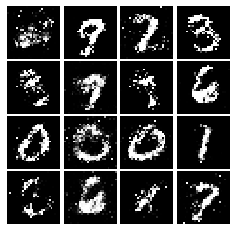

Epoch: 8, Iter: 3920, D: 1.278, G:0.8441


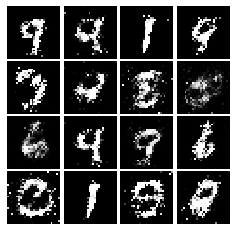

Epoch: 8, Iter: 3940, D: 1.29, G:0.7909


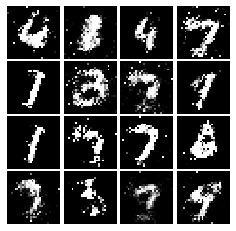

Epoch: 8, Iter: 3960, D: 1.299, G:0.7575


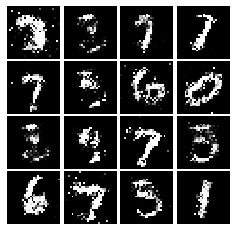

Epoch: 8, Iter: 3980, D: 1.267, G:0.778


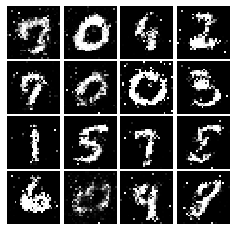

Epoch: 8, Iter: 4000, D: 1.317, G:0.8497


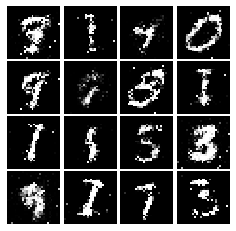

Epoch: 8, Iter: 4020, D: 1.409, G:0.7634


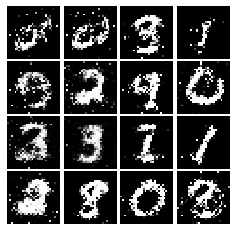

Epoch: 8, Iter: 4040, D: 1.383, G:0.7977


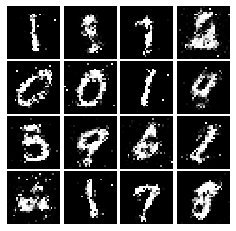

Epoch: 8, Iter: 4060, D: 1.26, G:0.8044


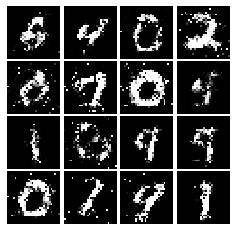

Epoch: 8, Iter: 4080, D: 1.341, G:0.8047


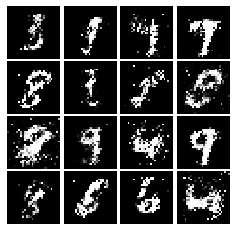

Epoch: 8, Iter: 4100, D: 1.436, G:0.9703


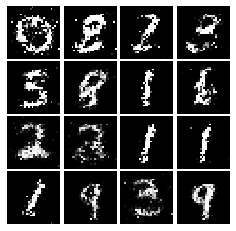

Epoch: 8, Iter: 4120, D: 1.293, G:0.8166


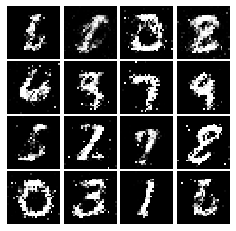

Epoch: 8, Iter: 4140, D: 1.411, G:0.9503


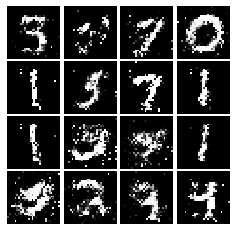

Epoch: 8, Iter: 4160, D: 1.346, G:0.9518


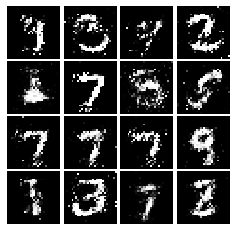

Epoch: 8, Iter: 4180, D: 1.285, G:0.7573


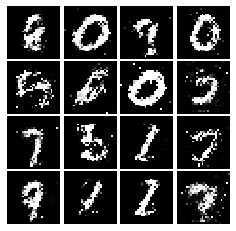

Epoch: 8, Iter: 4200, D: 1.302, G:0.8212


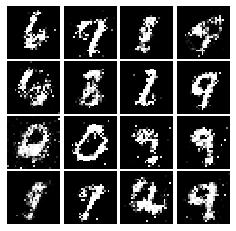

Epoch: 8, Iter: 4220, D: 1.308, G:0.7459


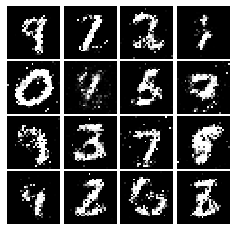

Epoch: 9, Iter: 4240, D: 1.344, G:0.6431


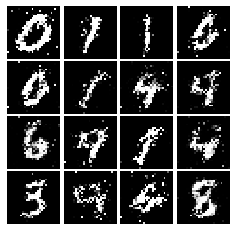

Epoch: 9, Iter: 4260, D: 1.397, G:0.8938


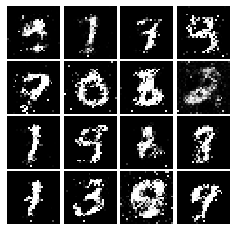

Epoch: 9, Iter: 4280, D: 1.277, G:0.8441


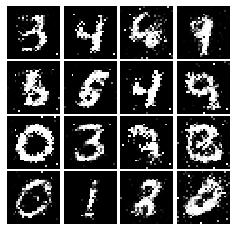

Epoch: 9, Iter: 4300, D: 1.399, G:0.7087


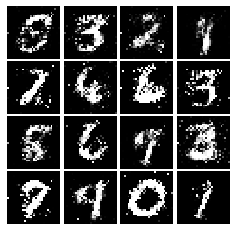

Epoch: 9, Iter: 4320, D: 1.402, G:0.8774


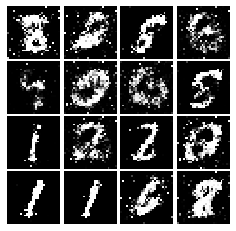

Epoch: 9, Iter: 4340, D: 1.317, G:0.7691


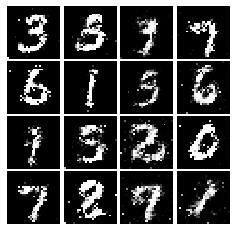

Epoch: 9, Iter: 4360, D: 1.427, G:0.8051


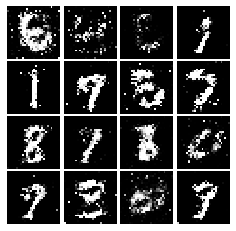

Epoch: 9, Iter: 4380, D: 1.401, G:0.7967


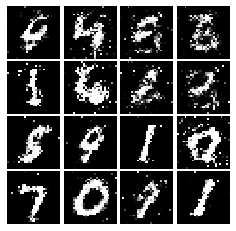

Epoch: 9, Iter: 4400, D: 1.221, G:0.8202


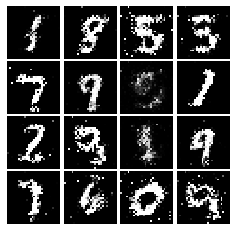

Epoch: 9, Iter: 4420, D: 1.335, G:0.7985


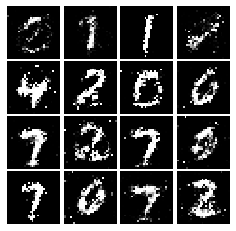

Epoch: 9, Iter: 4440, D: 1.424, G:0.8697


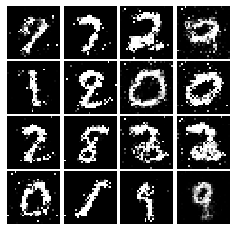

Epoch: 9, Iter: 4460, D: 1.396, G:0.71


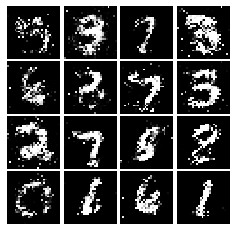

Epoch: 9, Iter: 4480, D: 1.336, G:0.7444


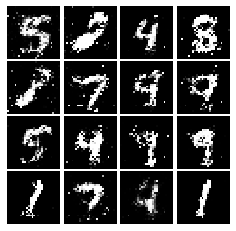

Epoch: 9, Iter: 4500, D: 1.479, G:0.7802


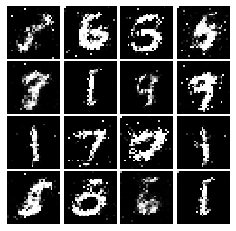

Epoch: 9, Iter: 4520, D: 1.342, G:0.8149


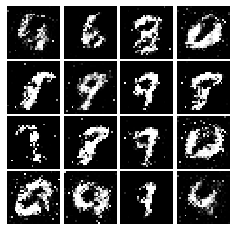

Epoch: 9, Iter: 4540, D: 1.335, G:0.8003


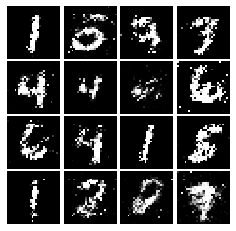

Epoch: 9, Iter: 4560, D: 1.327, G:0.7697


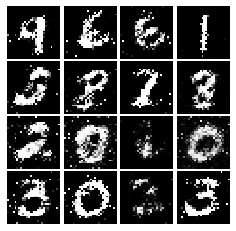

Epoch: 9, Iter: 4580, D: 1.347, G:0.8433


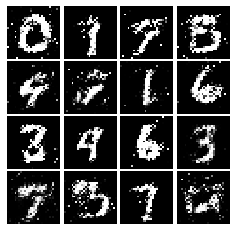

Epoch: 9, Iter: 4600, D: 1.406, G:0.7826


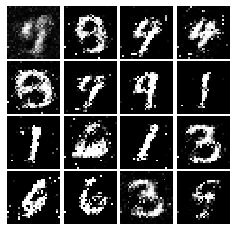

Epoch: 9, Iter: 4620, D: 1.315, G:0.8449


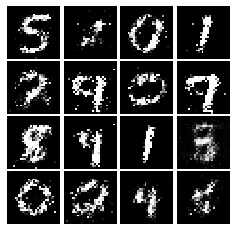

Epoch: 9, Iter: 4640, D: 1.598, G:0.7011


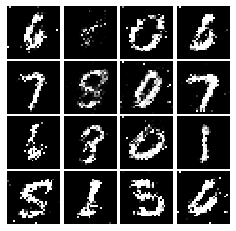

Epoch: 9, Iter: 4660, D: 1.36, G:0.7388


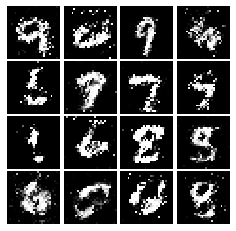

Epoch: 9, Iter: 4680, D: 1.36, G:0.888


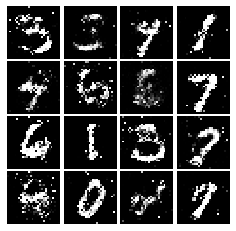

Final images


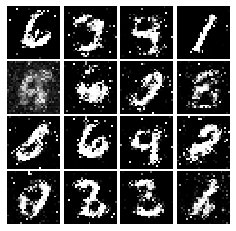

In [17]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss)

# Least Squares GAN
We'll now look at [Least Squares GAN](https://arxiv.org/abs/1611.04076), a newer, more stable alternative to the original GAN loss function. For this part, all we have to do is change the loss function and retrain the model. We'll implement equation (9) in the paper, with the generator loss:
$$\ell_G  =  \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[\left(D(G(z))-1\right)^2\right]$$
and the discriminator loss:
$$ \ell_D = \frac{1}{2}\mathbb{E}_{x \sim p_\text{data}}\left[\left(D(x)-1\right)^2\right] + \frac{1}{2}\mathbb{E}_{z \sim p(z)}\left[ \left(D(G(z))\right)^2\right]$$


**HINTS**: Instead of computing the expectation, we will be averaging over elements of the minibatch, so make sure to combine the loss by averaging instead of summing. When plugging in for $D(x)$ and $D(G(z))$ use the direct output from the discriminator (`score_real` and `score_fake`).

In [18]:
def ls_discriminator_loss(scores_real, scores_fake):
    """
    Compute the Least-Squares GAN loss for the discriminator.
    
    Inputs:
    - scores_real: Tensor of shape (N, 1) giving scores for the real data.
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_real - 1)) + 0.5*tf.reduce_mean(tf.square(scores_fake))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

def ls_generator_loss(scores_fake):
    """
    Computes the Least-Squares GAN loss for the generator.
    
    Inputs:
    - scores_fake: Tensor of shape (N, 1) giving scores for the fake data.
    
    Outputs:
    - loss: A Tensor containing the loss.
    """
    loss = None
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

    loss = 0.5*tf.reduce_mean(tf.square(scores_fake - 1))

    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    return loss

Test your LSGAN loss. You should see errors less than 1e-8.

In [19]:
def test_lsgan_loss(score_real, score_fake, d_loss_true, g_loss_true):
    
    d_loss = ls_discriminator_loss(tf.constant(score_real), tf.constant(score_fake))
    g_loss = ls_generator_loss(tf.constant(score_fake))
    print("Maximum error in d_loss: %g"%rel_error(d_loss_true, d_loss))
    print("Maximum error in g_loss: %g"%rel_error(g_loss_true, g_loss))

test_lsgan_loss(answers['logits_real'], answers['logits_fake'],
                answers['d_loss_lsgan_true'], answers['g_loss_lsgan_true'])

Maximum error in d_loss: 0
Maximum error in g_loss: 0


Create new training steps so we instead minimize the LSGAN loss:

Epoch: 0, Iter: 0, D: 0.163, G:0.3956


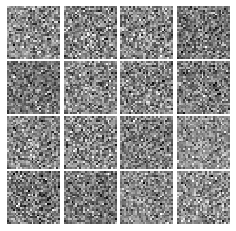

Epoch: 0, Iter: 20, D: 0.02645, G:1.056


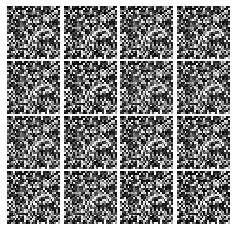

Epoch: 0, Iter: 40, D: 0.01857, G:0.7348


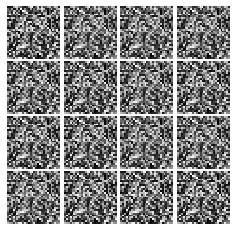

Epoch: 0, Iter: 60, D: 0.04788, G:0.6078


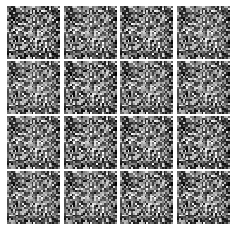

Epoch: 0, Iter: 80, D: 0.03516, G:0.8521


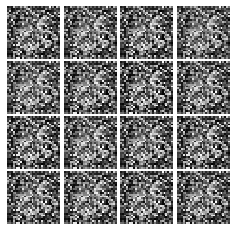

Epoch: 0, Iter: 100, D: 0.06152, G:0.4723


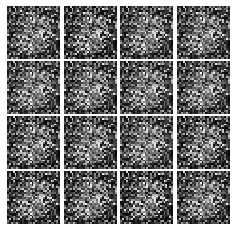

Epoch: 0, Iter: 120, D: 0.02619, G:0.7785


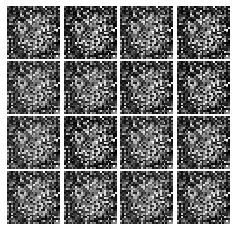

Epoch: 0, Iter: 140, D: 0.07565, G:0.4934


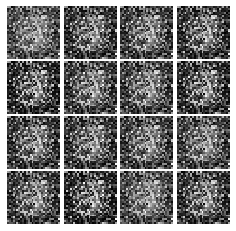

Epoch: 0, Iter: 160, D: 0.129, G:0.2361


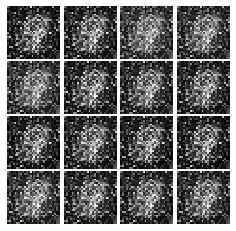

Epoch: 0, Iter: 180, D: 0.1686, G:0.8976


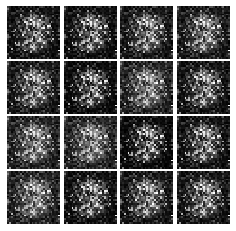

Epoch: 0, Iter: 200, D: 0.1105, G:0.3483


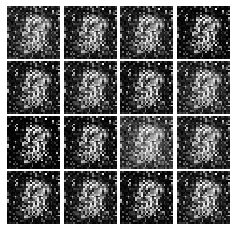

Epoch: 0, Iter: 220, D: 0.3406, G:0.7215


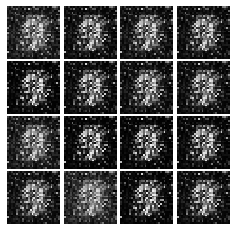

Epoch: 0, Iter: 240, D: 0.2277, G:0.9381


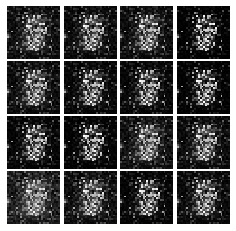

Epoch: 0, Iter: 260, D: 0.04776, G:0.5068


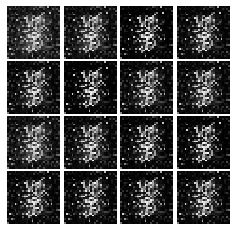

Epoch: 0, Iter: 280, D: 0.05803, G:0.325


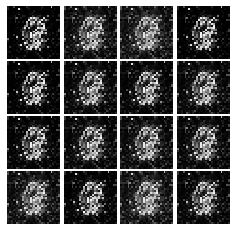

Epoch: 0, Iter: 300, D: 0.1659, G:0.3741


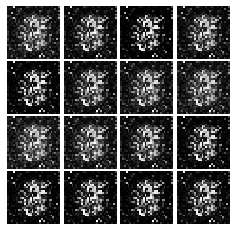

Epoch: 0, Iter: 320, D: 0.02298, G:0.6661


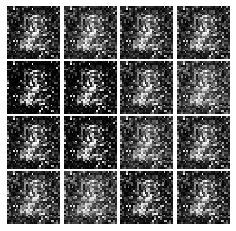

Epoch: 0, Iter: 340, D: 0.4099, G:1.535


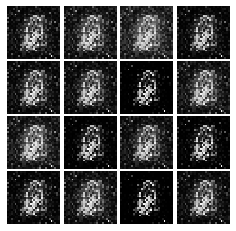

Epoch: 0, Iter: 360, D: 0.1387, G:0.4154


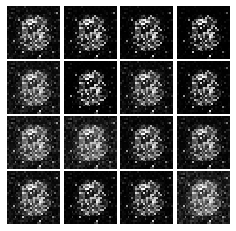

Epoch: 0, Iter: 380, D: 0.09828, G:0.5022


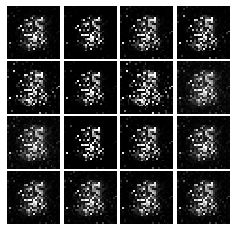

Epoch: 0, Iter: 400, D: 0.133, G:0.9203


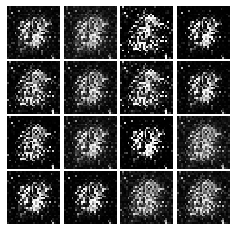

Epoch: 0, Iter: 420, D: 0.2666, G:0.04321


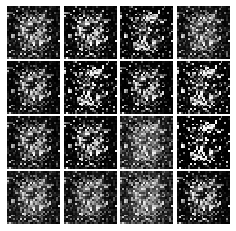

Epoch: 0, Iter: 440, D: 0.1306, G:0.08423


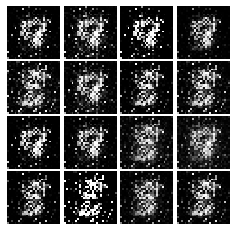

Epoch: 0, Iter: 460, D: 0.161, G:0.1991


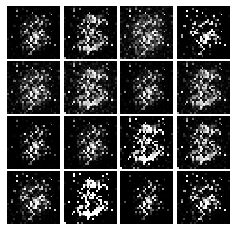

Epoch: 1, Iter: 480, D: 0.2099, G:0.1845


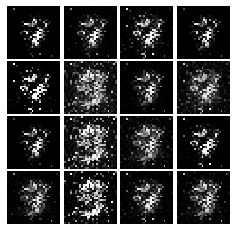

Epoch: 1, Iter: 500, D: 0.5164, G:0.3587


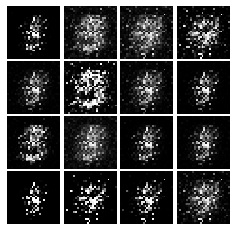

Epoch: 1, Iter: 520, D: 0.192, G:0.393


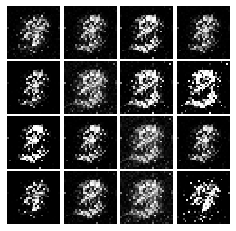

Epoch: 1, Iter: 540, D: 0.1686, G:0.3123


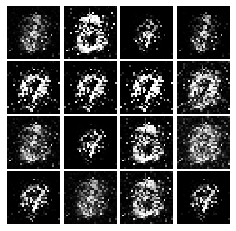

Epoch: 1, Iter: 560, D: 0.158, G:0.3182


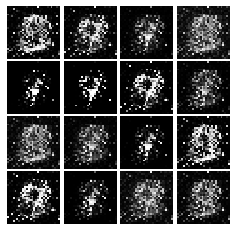

Epoch: 1, Iter: 580, D: 0.1317, G:0.3409


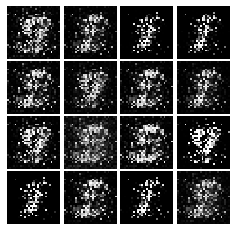

Epoch: 1, Iter: 600, D: 0.08163, G:0.5012


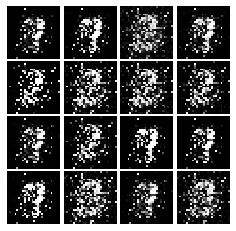

Epoch: 1, Iter: 620, D: 0.1003, G:0.4355


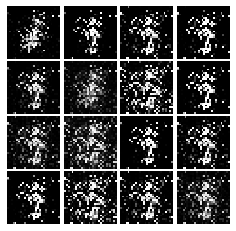

Epoch: 1, Iter: 640, D: 0.1556, G:0.2945


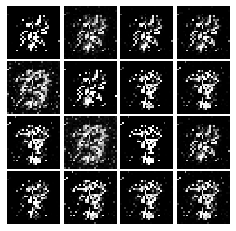

Epoch: 1, Iter: 660, D: 0.2042, G:0.3029


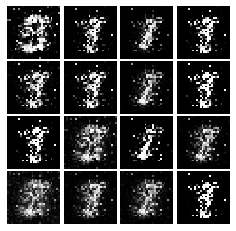

Epoch: 1, Iter: 680, D: 0.3708, G:0.2112


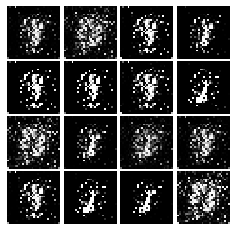

Epoch: 1, Iter: 700, D: 0.1163, G:0.4411


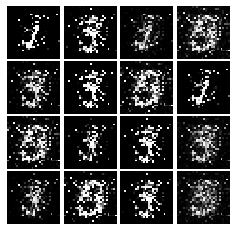

Epoch: 1, Iter: 720, D: 0.1458, G:0.4906


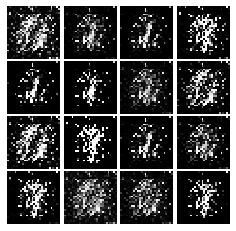

Epoch: 1, Iter: 740, D: 0.144, G:0.2839


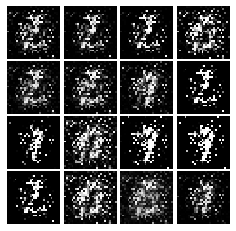

Epoch: 1, Iter: 760, D: 0.1898, G:0.1291


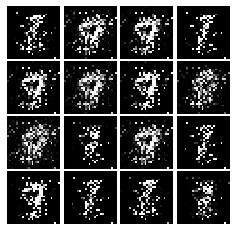

Epoch: 1, Iter: 780, D: 0.1259, G:0.3016


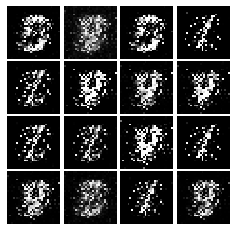

Epoch: 1, Iter: 800, D: 0.1626, G:0.2774


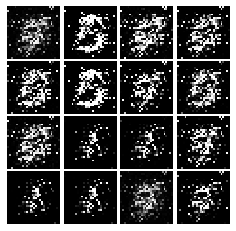

Epoch: 1, Iter: 820, D: 0.08213, G:0.3825


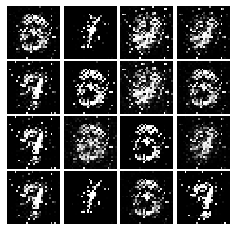

Epoch: 1, Iter: 840, D: 0.1411, G:0.5327


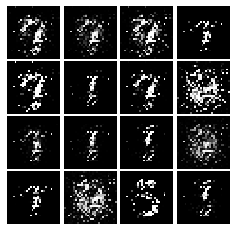

Epoch: 1, Iter: 860, D: 0.08755, G:0.5134


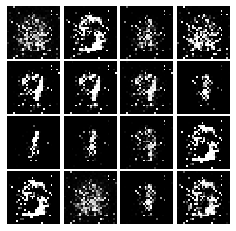

Epoch: 1, Iter: 880, D: 0.093, G:0.4372


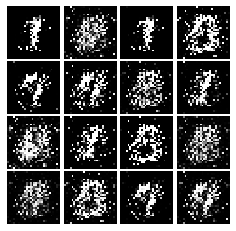

Epoch: 1, Iter: 900, D: 0.08499, G:0.3783


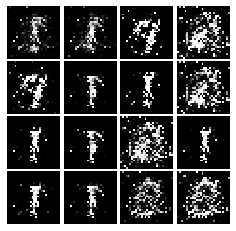

Epoch: 1, Iter: 920, D: 0.109, G:0.2858


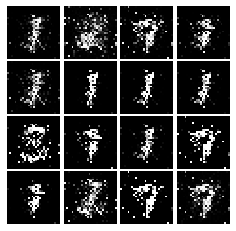

Epoch: 2, Iter: 940, D: 0.1236, G:0.3047


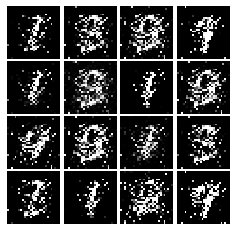

Epoch: 2, Iter: 960, D: 0.2678, G:0.3977


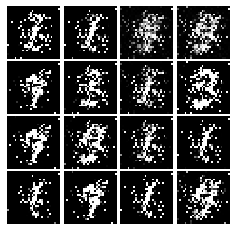

Epoch: 2, Iter: 980, D: 1.625, G:0.6979


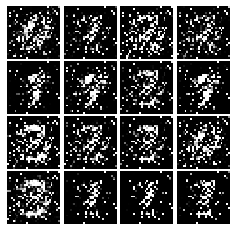

Epoch: 2, Iter: 1000, D: 0.1298, G:0.2775


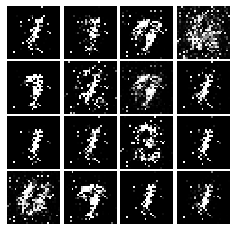

Epoch: 2, Iter: 1020, D: 0.2228, G:0.1765


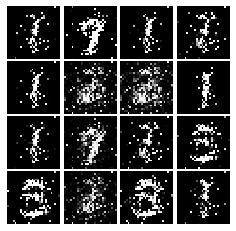

Epoch: 2, Iter: 1040, D: 0.1198, G:0.3372


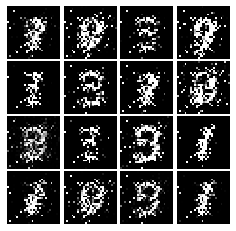

Epoch: 2, Iter: 1060, D: 0.4527, G:0.3032


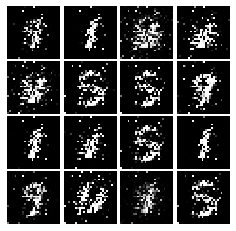

Epoch: 2, Iter: 1080, D: 0.5417, G:0.4984


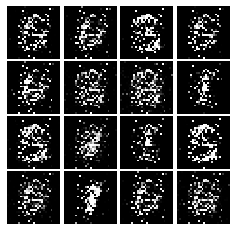

Epoch: 2, Iter: 1100, D: 0.132, G:0.2998


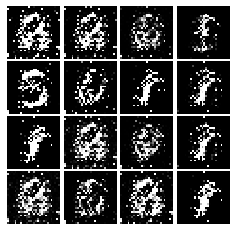

Epoch: 2, Iter: 1120, D: 0.1008, G:0.4286


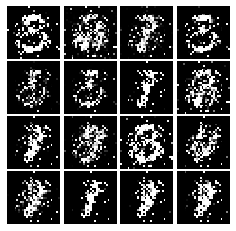

Epoch: 2, Iter: 1140, D: 0.1166, G:0.2972


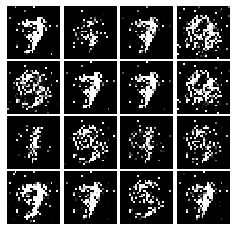

Epoch: 2, Iter: 1160, D: 0.1174, G:0.332


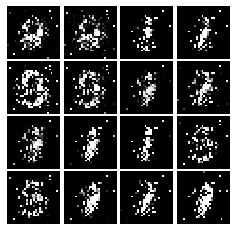

Epoch: 2, Iter: 1180, D: 0.1129, G:0.9568


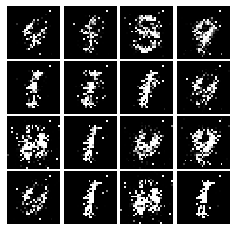

Epoch: 2, Iter: 1200, D: 0.08174, G:0.3848


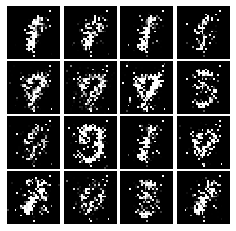

Epoch: 2, Iter: 1220, D: 0.1027, G:0.5721


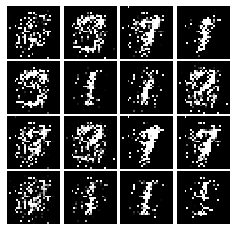

Epoch: 2, Iter: 1240, D: 0.1452, G:0.5778


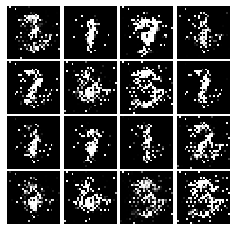

Epoch: 2, Iter: 1260, D: 0.1296, G:0.9876


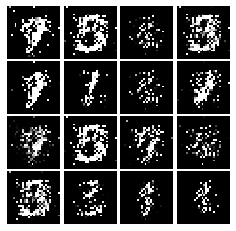

Epoch: 2, Iter: 1280, D: 0.127, G:0.317


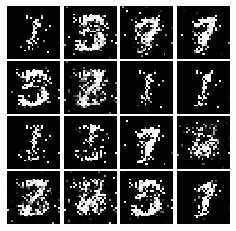

Epoch: 2, Iter: 1300, D: 0.1269, G:0.4381


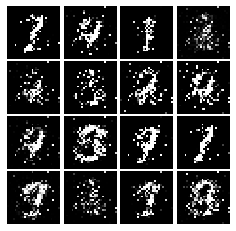

Epoch: 2, Iter: 1320, D: 0.1032, G:0.4902


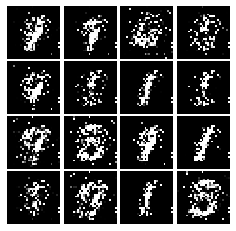

Epoch: 2, Iter: 1340, D: 0.07611, G:0.5434


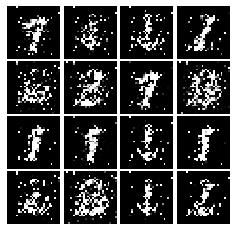

Epoch: 2, Iter: 1360, D: 0.126, G:0.4036


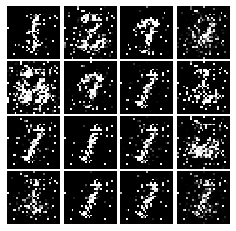

Epoch: 2, Iter: 1380, D: 0.0913, G:0.3283


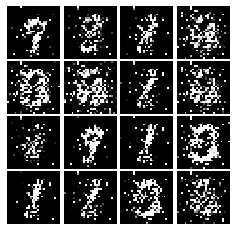

Epoch: 2, Iter: 1400, D: 0.09159, G:0.4058


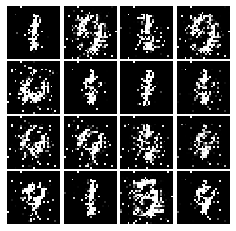

Epoch: 3, Iter: 1420, D: 0.1155, G:0.2911


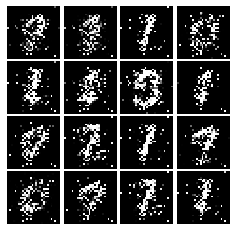

Epoch: 3, Iter: 1440, D: 0.2745, G:0.8462


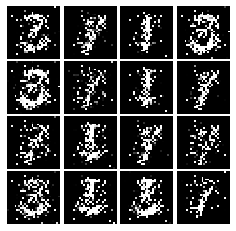

Epoch: 3, Iter: 1460, D: 0.1716, G:0.3097


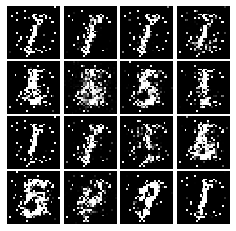

Epoch: 3, Iter: 1480, D: 0.1369, G:0.3544


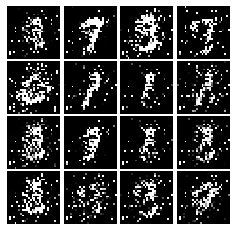

Epoch: 3, Iter: 1500, D: 0.1344, G:0.3985


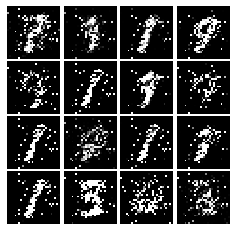

Epoch: 3, Iter: 1520, D: 0.2023, G:0.2484


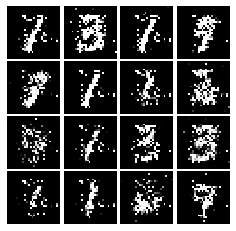

Epoch: 3, Iter: 1540, D: 0.1491, G:0.3556


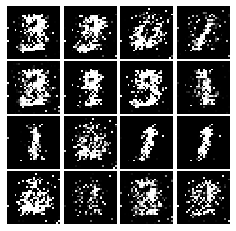

Epoch: 3, Iter: 1560, D: 0.1422, G:0.3253


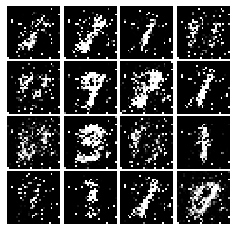

Epoch: 3, Iter: 1580, D: 0.1532, G:0.2844


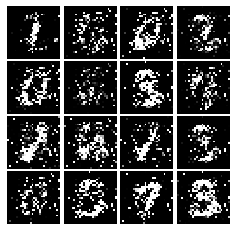

Epoch: 3, Iter: 1600, D: 0.1301, G:0.4644


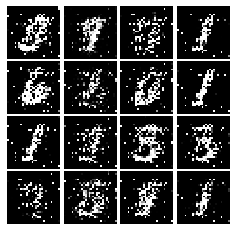

Epoch: 3, Iter: 1620, D: 0.1123, G:0.2952


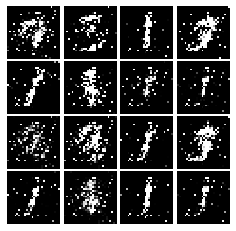

Epoch: 3, Iter: 1640, D: 0.1297, G:0.2802


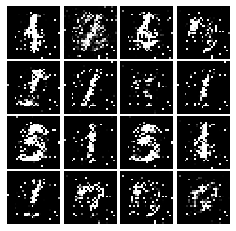

Epoch: 3, Iter: 1660, D: 0.1654, G:0.2573


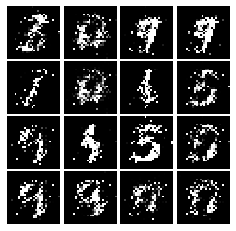

Epoch: 3, Iter: 1680, D: 0.2272, G:0.1645


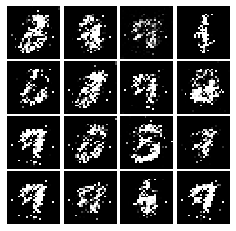

Epoch: 3, Iter: 1700, D: 0.1545, G:0.2607


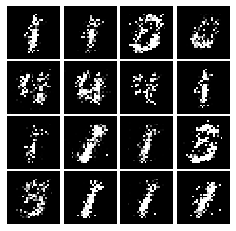

Epoch: 3, Iter: 1720, D: 0.2378, G:0.2134


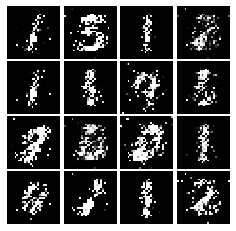

Epoch: 3, Iter: 1740, D: 0.1616, G:0.2939


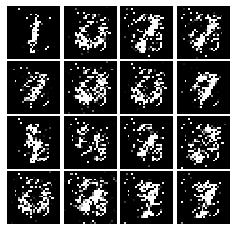

Epoch: 3, Iter: 1760, D: 0.1591, G:0.342


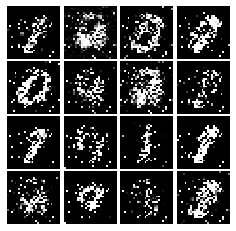

Epoch: 3, Iter: 1780, D: 0.1291, G:0.2576


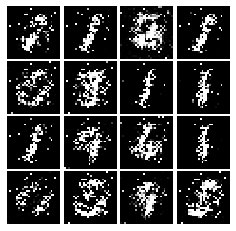

Epoch: 3, Iter: 1800, D: 0.3892, G:0.2672


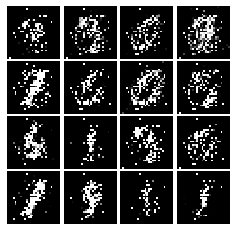

Epoch: 3, Iter: 1820, D: 0.0999, G:0.3212


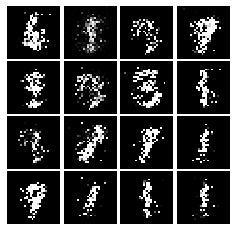

Epoch: 3, Iter: 1840, D: 0.127, G:0.2909


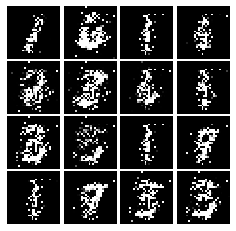

Epoch: 3, Iter: 1860, D: 0.1237, G:0.3473


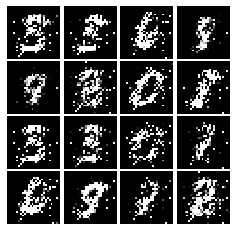

Epoch: 4, Iter: 1880, D: 0.1191, G:0.29


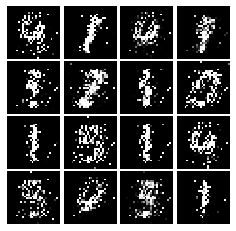

Epoch: 4, Iter: 1900, D: 0.1368, G:0.2668


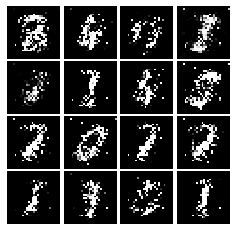

Epoch: 4, Iter: 1920, D: 0.1585, G:0.2871


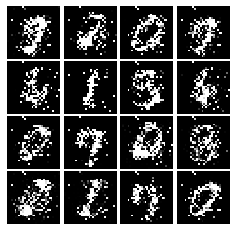

Epoch: 4, Iter: 1940, D: 0.1763, G:0.41


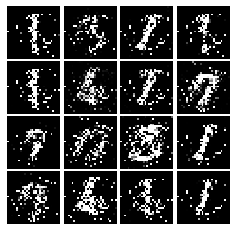

Epoch: 4, Iter: 1960, D: 0.2153, G:0.4476


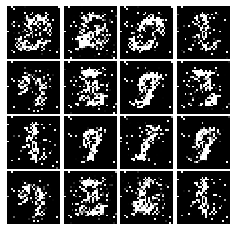

Epoch: 4, Iter: 1980, D: 0.2435, G:0.3979


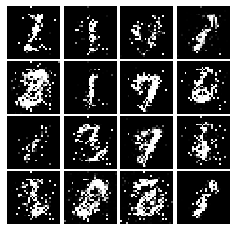

Epoch: 4, Iter: 2000, D: 0.2023, G:0.2414


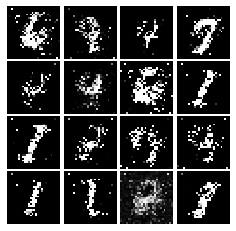

Epoch: 4, Iter: 2020, D: 0.1641, G:0.238


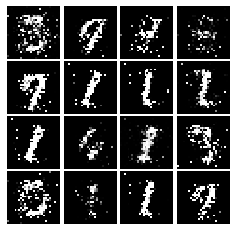

Epoch: 4, Iter: 2040, D: 0.2009, G:0.2356


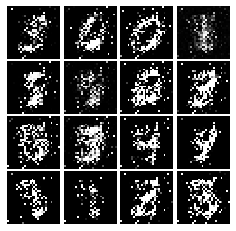

Epoch: 4, Iter: 2060, D: 0.1365, G:0.3213


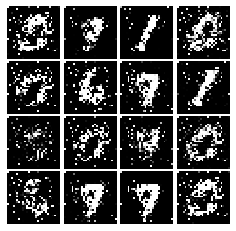

Epoch: 4, Iter: 2080, D: 0.1439, G:0.2607


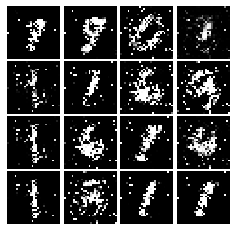

Epoch: 4, Iter: 2100, D: 0.1601, G:0.2436


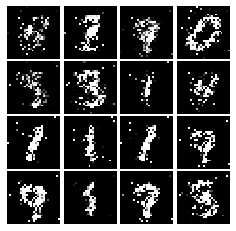

Epoch: 4, Iter: 2120, D: 0.1309, G:0.2043


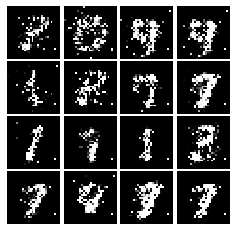

Epoch: 4, Iter: 2140, D: 0.1879, G:0.2259


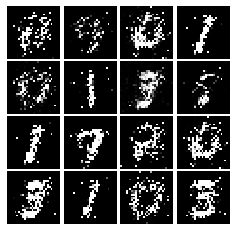

Epoch: 4, Iter: 2160, D: 0.1675, G:0.258


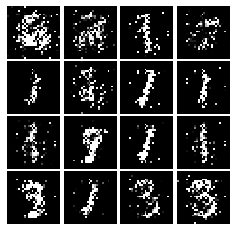

Epoch: 4, Iter: 2180, D: 0.1822, G:0.2154


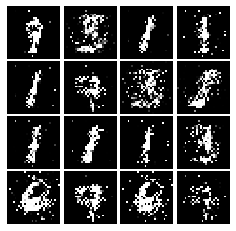

Epoch: 4, Iter: 2200, D: 0.174, G:0.2533


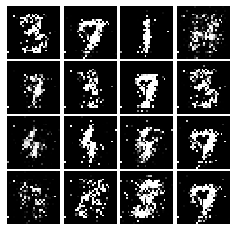

Epoch: 4, Iter: 2220, D: 0.2133, G:0.2376


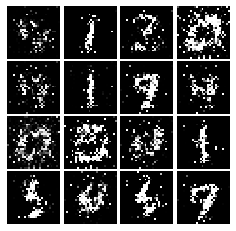

Epoch: 4, Iter: 2240, D: 0.1662, G:0.3293


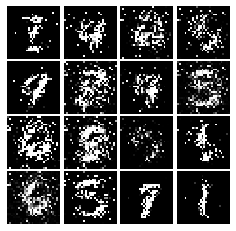

Epoch: 4, Iter: 2260, D: 0.132, G:0.3069


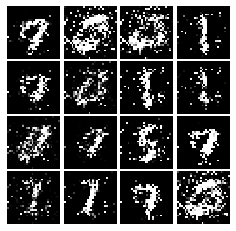

Epoch: 4, Iter: 2280, D: 0.2323, G:0.182


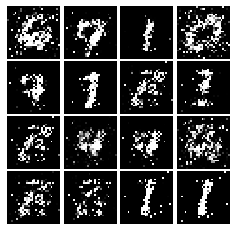

Epoch: 4, Iter: 2300, D: 0.1673, G:0.2211


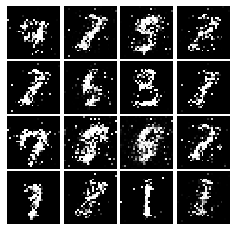

Epoch: 4, Iter: 2320, D: 0.1607, G:0.2217


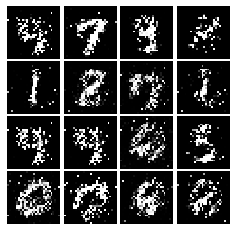

Epoch: 4, Iter: 2340, D: 0.1519, G:0.2349


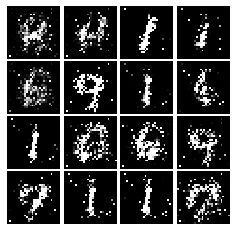

Epoch: 5, Iter: 2360, D: 0.1896, G:0.2142


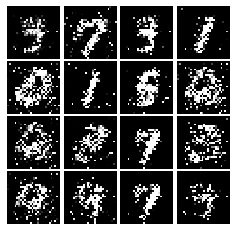

Epoch: 5, Iter: 2380, D: 0.2164, G:0.2323


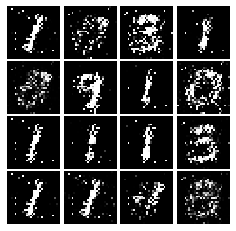

Epoch: 5, Iter: 2400, D: 0.1797, G:0.2029


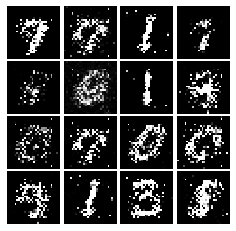

Epoch: 5, Iter: 2420, D: 0.2081, G:0.2575


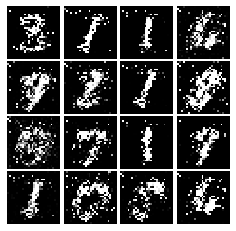

Epoch: 5, Iter: 2440, D: 0.1835, G:0.219


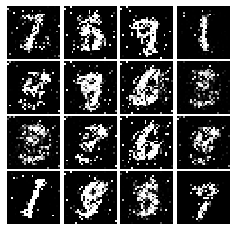

Epoch: 5, Iter: 2460, D: 0.1613, G:0.2141


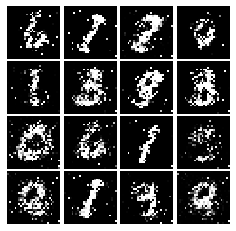

Epoch: 5, Iter: 2480, D: 0.2185, G:0.2331


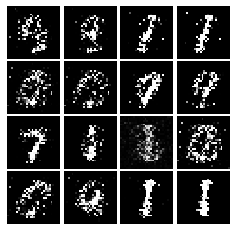

Epoch: 5, Iter: 2500, D: 0.215, G:0.3973


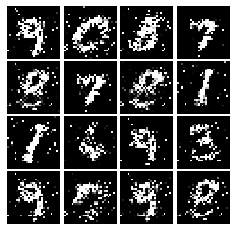

Epoch: 5, Iter: 2520, D: 0.2209, G:0.1415


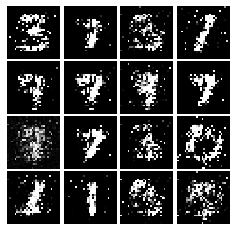

Epoch: 5, Iter: 2540, D: 0.2864, G:0.4663


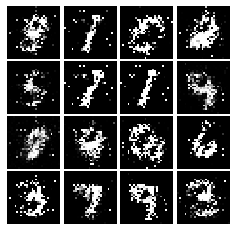

Epoch: 5, Iter: 2560, D: 0.2358, G:0.2226


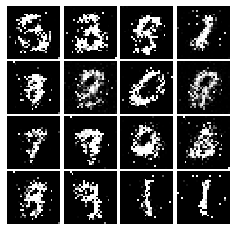

Epoch: 5, Iter: 2580, D: 0.1517, G:0.2694


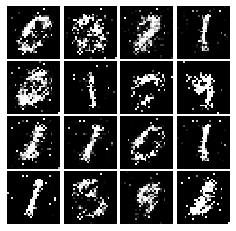

Epoch: 5, Iter: 2600, D: 0.2992, G:0.1676


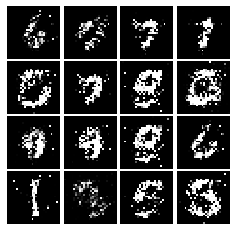

Epoch: 5, Iter: 2620, D: 0.1977, G:0.2153


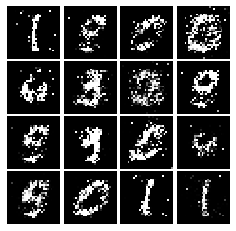

Epoch: 5, Iter: 2640, D: 0.2347, G:0.2323


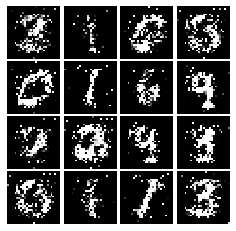

Epoch: 5, Iter: 2660, D: 0.1944, G:0.1953


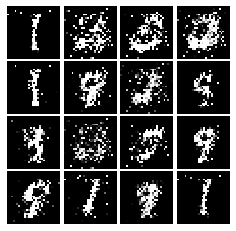

Epoch: 5, Iter: 2680, D: 0.2095, G:0.192


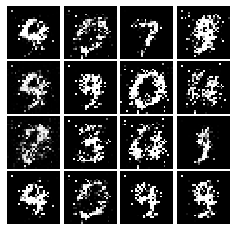

Epoch: 5, Iter: 2700, D: 0.232, G:0.1947


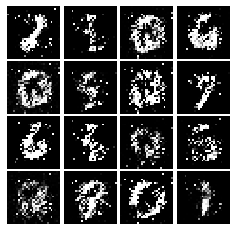

Epoch: 5, Iter: 2720, D: 0.2066, G:0.2334


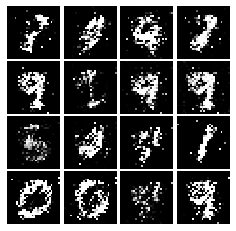

Epoch: 5, Iter: 2740, D: 0.2239, G:0.1791


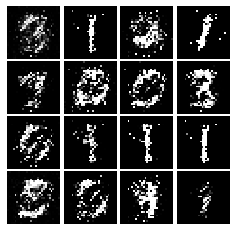

Epoch: 5, Iter: 2760, D: 0.2002, G:0.2051


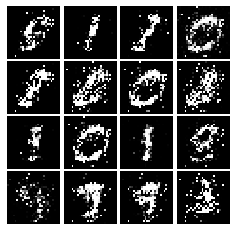

Epoch: 5, Iter: 2780, D: 0.1876, G:0.153


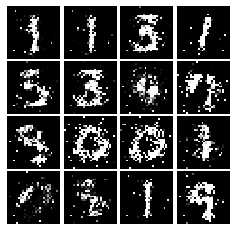

Epoch: 5, Iter: 2800, D: 0.2062, G:0.2101


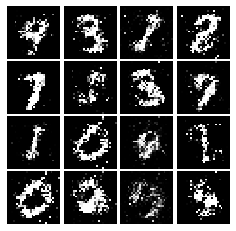

Epoch: 6, Iter: 2820, D: 0.2085, G:0.1957


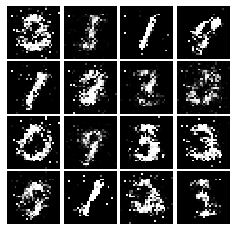

Epoch: 6, Iter: 2840, D: 0.2352, G:0.1816


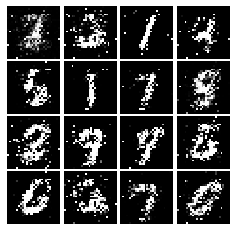

Epoch: 6, Iter: 2860, D: 0.2181, G:0.2211


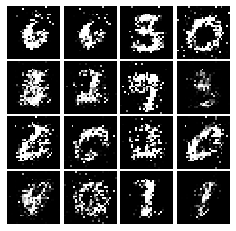

Epoch: 6, Iter: 2880, D: 0.2241, G:0.1926


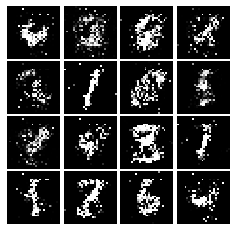

Epoch: 6, Iter: 2900, D: 0.216, G:0.1779


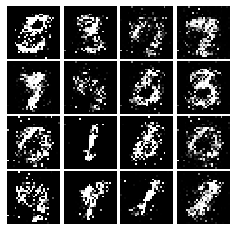

Epoch: 6, Iter: 2920, D: 0.2237, G:0.174


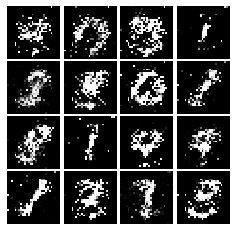

Epoch: 6, Iter: 2940, D: 0.2256, G:0.1499


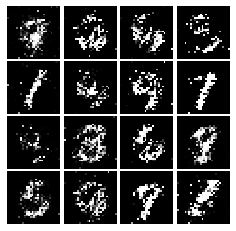

Epoch: 6, Iter: 2960, D: 0.2217, G:0.1621


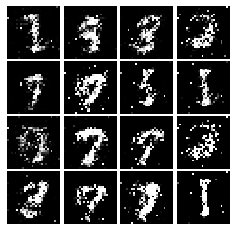

Epoch: 6, Iter: 2980, D: 0.2624, G:0.1651


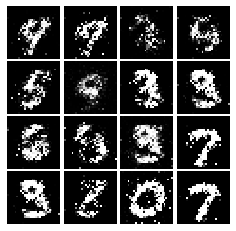

Epoch: 6, Iter: 3000, D: 0.2508, G:0.175


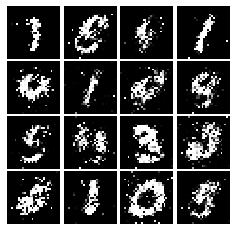

Epoch: 6, Iter: 3020, D: 0.2482, G:0.1434


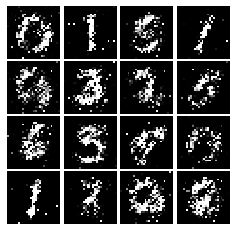

Epoch: 6, Iter: 3040, D: 0.2456, G:0.1676


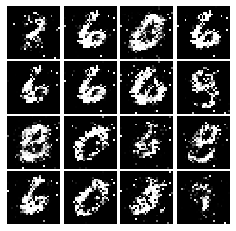

Epoch: 6, Iter: 3060, D: 0.2328, G:0.1447


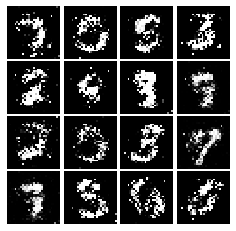

Epoch: 6, Iter: 3080, D: 0.2157, G:0.1806


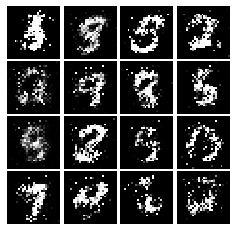

Epoch: 6, Iter: 3100, D: 0.2108, G:0.2127


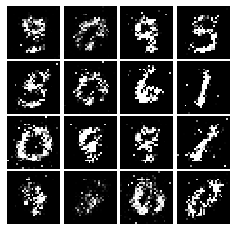

Epoch: 6, Iter: 3120, D: 0.2238, G:0.1652


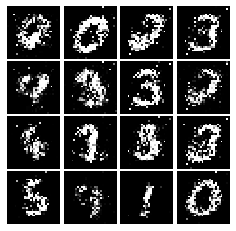

Epoch: 6, Iter: 3140, D: 0.2365, G:0.2052


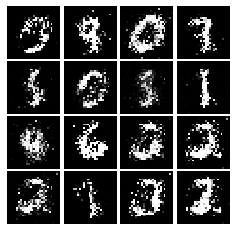

Epoch: 6, Iter: 3160, D: 0.2082, G:0.1561


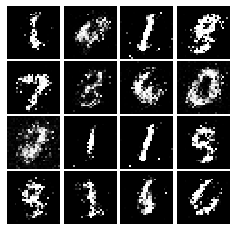

Epoch: 6, Iter: 3180, D: 0.2259, G:0.1971


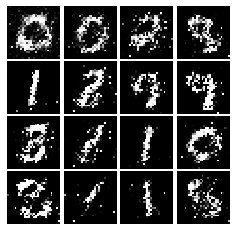

Epoch: 6, Iter: 3200, D: 0.2418, G:0.1463


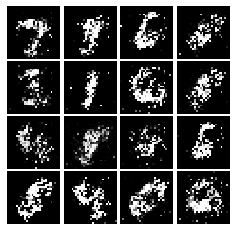

Epoch: 6, Iter: 3220, D: 0.2213, G:0.1535


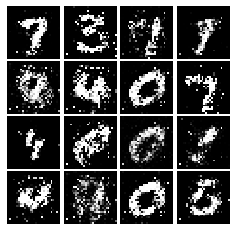

Epoch: 6, Iter: 3240, D: 0.1984, G:0.1684


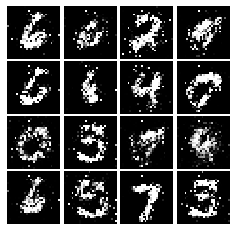

Epoch: 6, Iter: 3260, D: 0.2173, G:0.1541


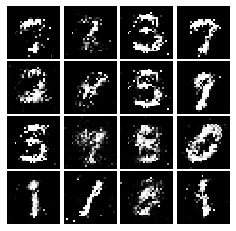

Epoch: 6, Iter: 3280, D: 0.2414, G:0.1719


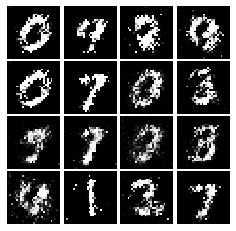

Epoch: 7, Iter: 3300, D: 0.2007, G:0.1865


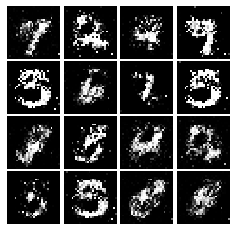

Epoch: 7, Iter: 3320, D: 0.2229, G:0.1867


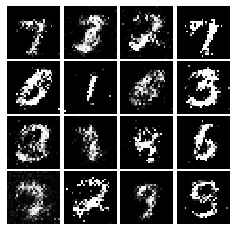

Epoch: 7, Iter: 3340, D: 0.2451, G:0.1796


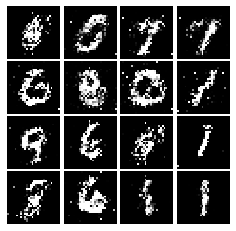

Epoch: 7, Iter: 3360, D: 0.2322, G:0.1716


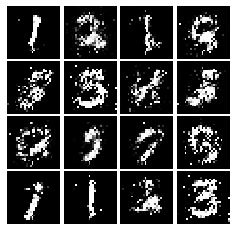

Epoch: 7, Iter: 3380, D: 0.2216, G:0.1888


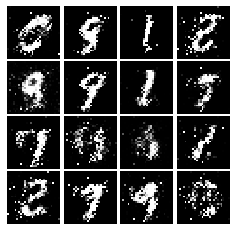

Epoch: 7, Iter: 3400, D: 0.2543, G:0.1927


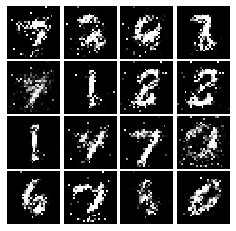

Epoch: 7, Iter: 3420, D: 0.2359, G:0.1572


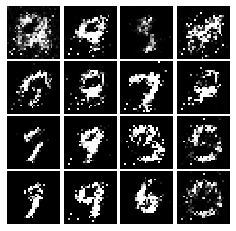

Epoch: 7, Iter: 3440, D: 0.2456, G:0.1689


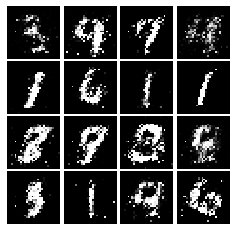

Epoch: 7, Iter: 3460, D: 0.2406, G:0.1644


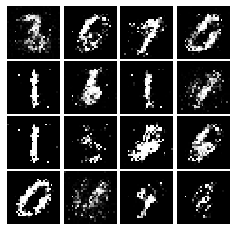

Epoch: 7, Iter: 3480, D: 0.2437, G:0.1709


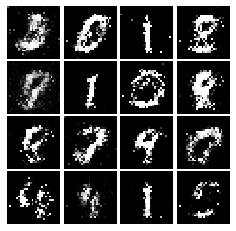

Epoch: 7, Iter: 3500, D: 0.2537, G:0.1571


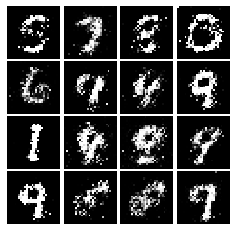

Epoch: 7, Iter: 3520, D: 0.2429, G:0.128


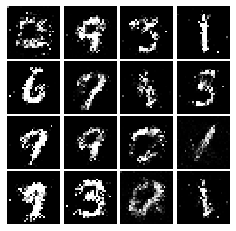

Epoch: 7, Iter: 3540, D: 0.23, G:0.1618


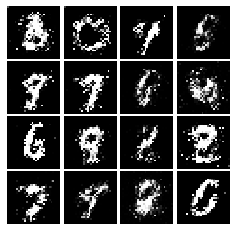

Epoch: 7, Iter: 3560, D: 0.2363, G:0.1727


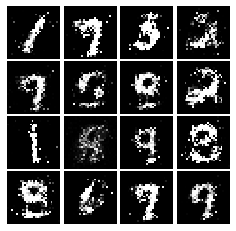

Epoch: 7, Iter: 3580, D: 0.2358, G:0.1376


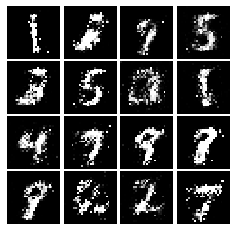

Epoch: 7, Iter: 3600, D: 0.2507, G:0.1549


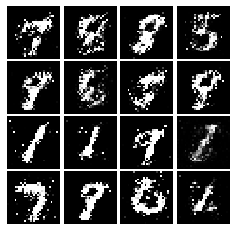

Epoch: 7, Iter: 3620, D: 0.2277, G:0.1596


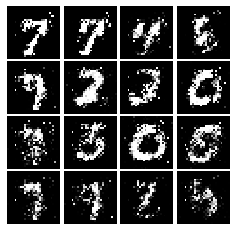

Epoch: 7, Iter: 3640, D: 0.2565, G:0.1513


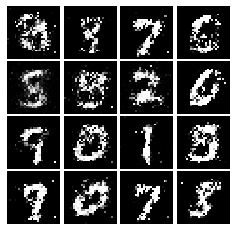

Epoch: 7, Iter: 3660, D: 0.2473, G:0.1582


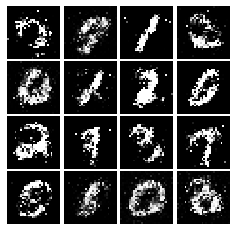

Epoch: 7, Iter: 3680, D: 0.2363, G:0.146


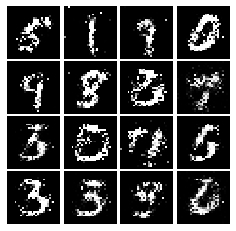

Epoch: 7, Iter: 3700, D: 0.2423, G:0.1562


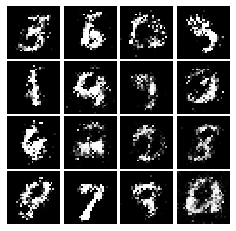

Epoch: 7, Iter: 3720, D: 0.2386, G:0.1496


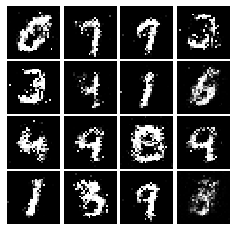

Epoch: 7, Iter: 3740, D: 0.2503, G:0.1387


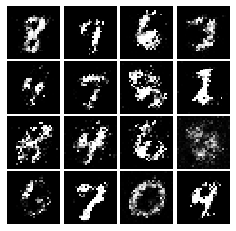

Epoch: 8, Iter: 3760, D: 0.2407, G:0.1495


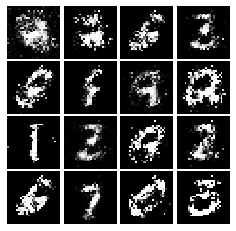

Epoch: 8, Iter: 3780, D: 0.2426, G:0.1563


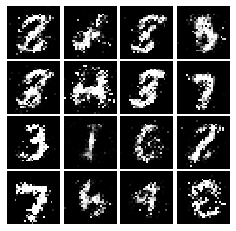

Epoch: 8, Iter: 3800, D: 0.2538, G:0.1699


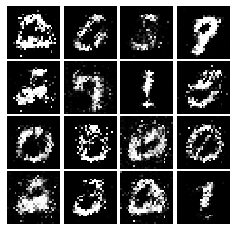

Epoch: 8, Iter: 3820, D: 0.2251, G:0.1532


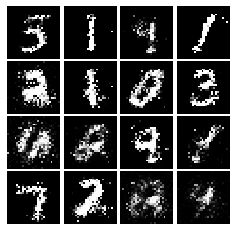

Epoch: 8, Iter: 3840, D: 0.2413, G:0.1607


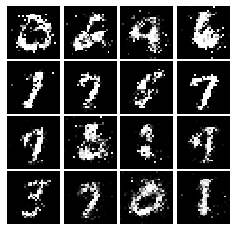

Epoch: 8, Iter: 3860, D: 0.2383, G:0.1489


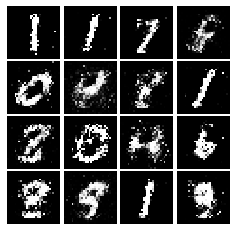

Epoch: 8, Iter: 3880, D: 0.2444, G:0.1523


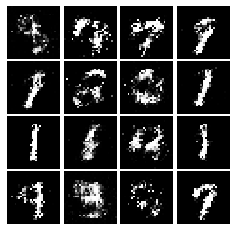

Epoch: 8, Iter: 3900, D: 0.246, G:0.1693


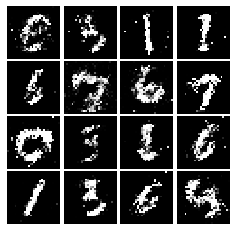

Epoch: 8, Iter: 3920, D: 0.2321, G:0.1673


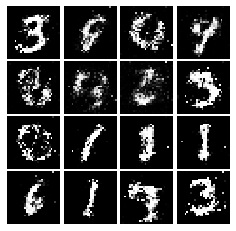

Epoch: 8, Iter: 3940, D: 0.2714, G:0.1414


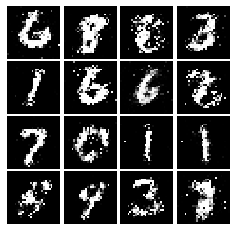

Epoch: 8, Iter: 3960, D: 0.2368, G:0.1473


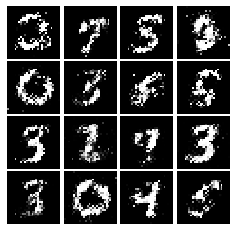

Epoch: 8, Iter: 3980, D: 0.2193, G:0.1633


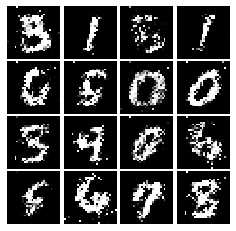

Epoch: 8, Iter: 4000, D: 0.2374, G:0.1608


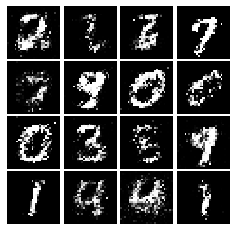

Epoch: 8, Iter: 4020, D: 0.2469, G:0.1562


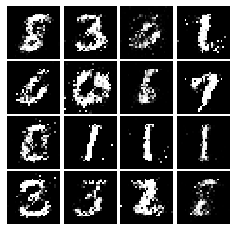

Epoch: 8, Iter: 4040, D: 0.2749, G:0.1524


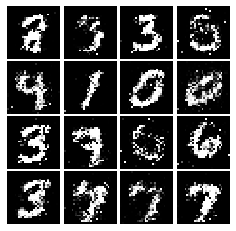

Epoch: 8, Iter: 4060, D: 0.2396, G:0.162


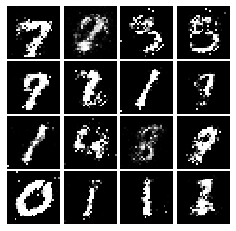

Epoch: 8, Iter: 4080, D: 0.2435, G:0.156


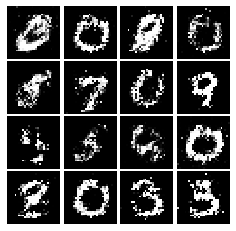

Epoch: 8, Iter: 4100, D: 0.2441, G:0.1488


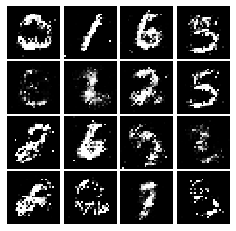

Epoch: 8, Iter: 4120, D: 0.2744, G:0.1518


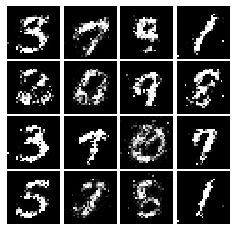

Epoch: 8, Iter: 4140, D: 0.2547, G:0.1017


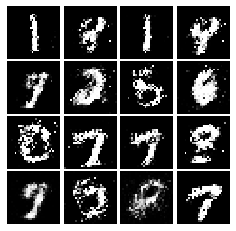

Epoch: 8, Iter: 4160, D: 0.2473, G:0.156


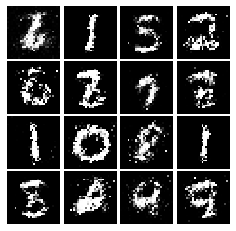

Epoch: 8, Iter: 4180, D: 0.2362, G:0.1481


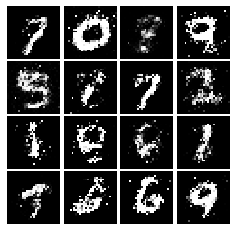

Epoch: 8, Iter: 4200, D: 0.2439, G:0.1773


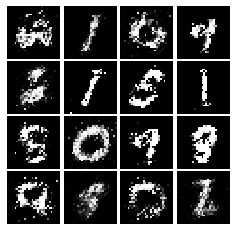

Epoch: 8, Iter: 4220, D: 0.239, G:0.1666


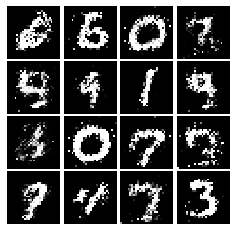

Epoch: 9, Iter: 4240, D: 0.2488, G:0.1373


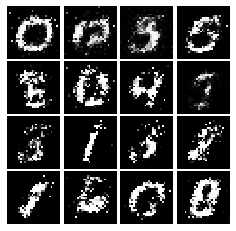

Epoch: 9, Iter: 4260, D: 0.2206, G:0.1482


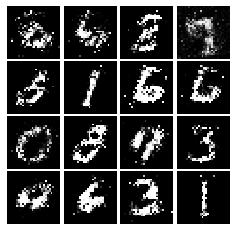

Epoch: 9, Iter: 4280, D: 0.2606, G:0.1808


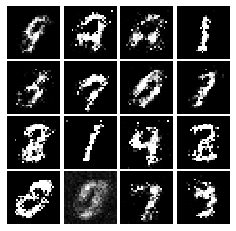

Epoch: 9, Iter: 4300, D: 0.221, G:0.1578


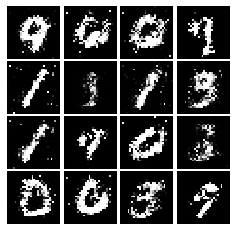

Epoch: 9, Iter: 4320, D: 0.2422, G:0.1509


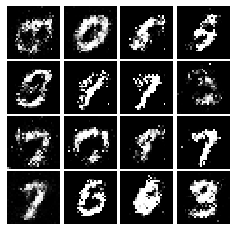

Epoch: 9, Iter: 4340, D: 0.248, G:0.1473


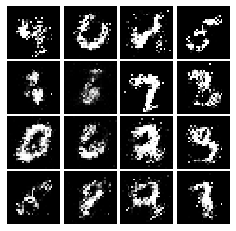

Epoch: 9, Iter: 4360, D: 0.2421, G:0.1477


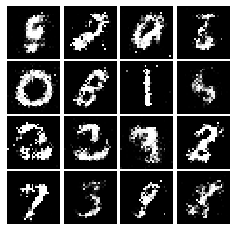

Epoch: 9, Iter: 4380, D: 0.2379, G:0.1634


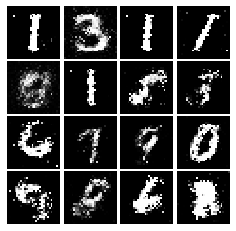

Epoch: 9, Iter: 4400, D: 0.2194, G:0.1834


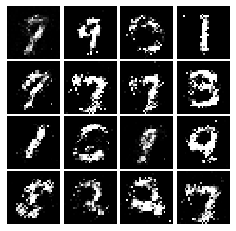

Epoch: 9, Iter: 4420, D: 0.2238, G:0.1616


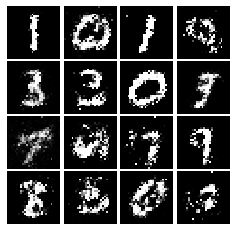

Epoch: 9, Iter: 4440, D: 0.2186, G:0.2563


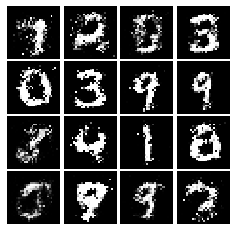

Epoch: 9, Iter: 4460, D: 0.2332, G:0.1525


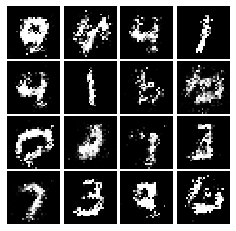

Epoch: 9, Iter: 4480, D: 0.2192, G:0.1897


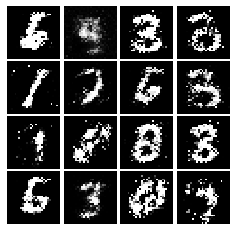

Epoch: 9, Iter: 4500, D: 0.2468, G:0.1476


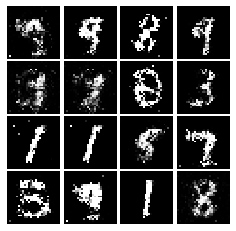

Epoch: 9, Iter: 4520, D: 0.2428, G:0.1786


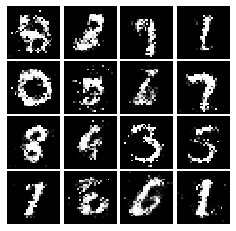

Epoch: 9, Iter: 4540, D: 0.242, G:0.1787


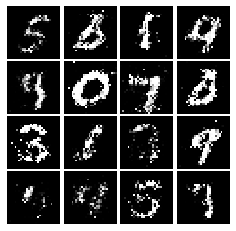

Epoch: 9, Iter: 4560, D: 0.2268, G:0.1633


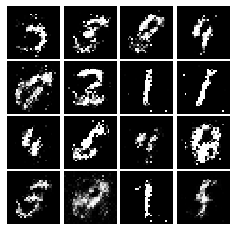

Epoch: 9, Iter: 4580, D: 0.2255, G:0.1578


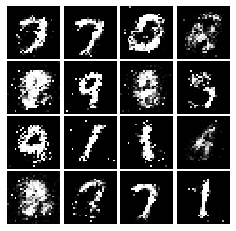

Epoch: 9, Iter: 4600, D: 0.2411, G:0.1718


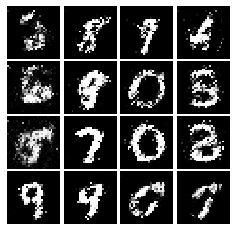

Epoch: 9, Iter: 4620, D: 0.2736, G:0.1529


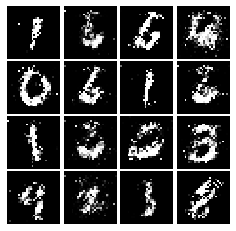

Epoch: 9, Iter: 4640, D: 0.2337, G:0.144


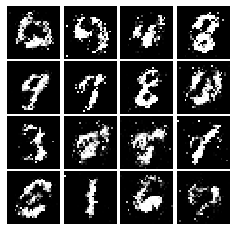

Epoch: 9, Iter: 4660, D: 0.2406, G:0.1299


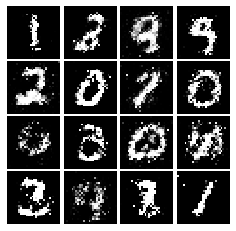

Epoch: 9, Iter: 4680, D: 0.2516, G:0.1779


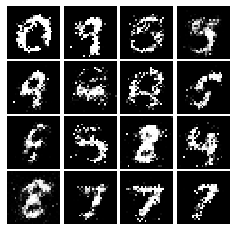

Final images


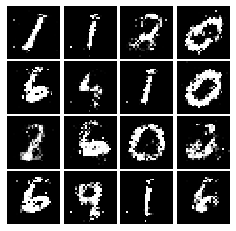

In [20]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, ls_discriminator_loss, ls_generator_loss)

# Deep Convolutional GANs
In the first part of the notebook, we implemented an almost direct copy of the original GAN network from Ian Goodfellow. However, this network architecture allows no real spatial reasoning. It is unable to reason about things like "sharp edges" in general because it lacks any convolutional layers. Thus, in this section, we will implement some of the ideas from [DCGAN](https://arxiv.org/abs/1511.06434), where we use convolutional networks as our discriminators and generators.

#### Discriminator
We will use a discriminator inspired by the TensorFlow MNIST classification [tutorial](https://www.tensorflow.org/get_started/mnist/pros), which is able to get above 99% accuracy on the MNIST dataset fairly quickly. *Be sure to check the dimensions of x and reshape when needed*, fully connected blocks expect [N,D] Tensors while conv2d blocks expect [N,H,W,C] Tensors. Please use `tf.keras.layers` to define the following architecture:

Architecture:
* Conv2D: 32 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Conv2D: 64 Filters, 5x5, Stride 1, padding 0
* Leaky ReLU(alpha=0.01)
* Max Pool 2x2, Stride 2
* Flatten
* Fully Connected with output size 4 x 4 x 64
* Leaky ReLU(alpha=0.01)
* Fully Connected with output size 1

Once again, please use biases for all convolutional and fully connected layers, and use the default parameter initializers. Note that a padding of 0 can be accomplished with the 'VALID' padding option.

In [21]:
def discriminator():
    """Compute discriminator score for a batch of input images.
    
    Inputs:
    - x: TensorFlow Tensor of flattened input images, shape [batch_size, 784]
    
    Returns:
    TensorFlow Tensor with shape [batch_size, 1], containing the score 
    for an image being real for each input image.
    """
    model = tf.keras.models.Sequential([
        # TODO: implement architecture
        # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(784),
        tf.keras.layers.Reshape((28,28,1)),
        tf.keras.layers.Conv2D(32,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Conv2D(64,(5,5),strides = 1,padding = 'VALID'),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.MaxPool2D((2,2),strides = 2),
        tf.keras.layers.Flatten(),
        tf.keras.layers.Dense(4*4*64),
        tf.keras.layers.LeakyReLU(0.01),
        tf.keras.layers.Dense(1)
        # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model

model = discriminator()
test_discriminator(1102721)

Correct number of parameters in discriminator.


#### Generator
For the generator, we will copy the architecture exactly from the [InfoGAN paper](https://arxiv.org/pdf/1606.03657.pdf). See Appendix C.1 MNIST. Please use `tf.keras.layers` for your implementation. You might find the documentation for [tf.keras.layers.Conv2DTranspose](https://www.tensorflow.org/versions/r2.0/api_docs/python/tf/keras/layers/Conv2DTranspose) useful. The architecture is as follows.

Architecture:
* Fully connected with output size 1024 
* `ReLU`
* BatchNorm
* Fully connected with output size 7 x 7 x 128 
* `ReLU`
* BatchNorm
* Resize into Image Tensor of size 7, 7, 128
* Conv2D^T (transpose): 64 filters of 4x4, stride 2
* `ReLU`
* BatchNorm
* Conv2d^T (transpose): 1 filter of 4x4, stride 2
* `TanH`

Once again, use biases for the fully connected and transpose convolutional layers. Please use the default initializers for your parameters. For padding, choose the 'same' option for transpose convolutions. For Batch Normalization, assume we are always in 'training' mode.

In [22]:
def generator(noise_dim=NOISE_DIM):
    """Generate images from a random noise vector.
    
    Inputs:
    - z: TensorFlow Tensor of random noise with shape [batch_size, noise_dim]
    
    Returns:
    TensorFlow Tensor of generated images, with shape [batch_size, 784].
    """
    model = tf.keras.models.Sequential([
    # TODO: implement architecture
    # *****START OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****

        tf.keras.layers.InputLayer(noise_dim),
        tf.keras.layers.Dense(1024,activation = 'relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Dense(7*7*128,activation = 'relu'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Reshape((7,7,128)),
        tf.keras.layers.Conv2DTranspose(filters=64,kernel_size=(4,4),strides = 2,activation = tf.nn.relu,padding = 'SAME'),
        tf.keras.layers.BatchNormalization(),
        tf.keras.layers.Conv2DTranspose(filters=1,kernel_size=(4,4),strides = 2,activation = tf.tanh,padding = 'SAME')
        
    # *****END OF YOUR CODE (DO NOT DELETE/MODIFY THIS LINE)*****
    ])
    return model
test_generator(6595521)

Correct number of parameters in generator.


We have to recreate our network since we've changed our functions.

### Train and evaluate a DCGAN
This is the one part of A3 that significantly benefits from using a GPU. It takes 3 minutes on a GPU for the requested five epochs. Or about 50 minutes on a dual core laptop on CPU (feel free to use 3 epochs if you do it on CPU).

Epoch: 0, Iter: 0, D: 1.303, G:0.6424


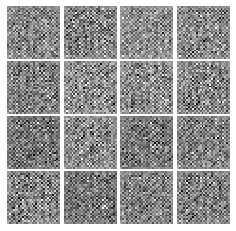

Epoch: 0, Iter: 20, D: 1.997, G:0.9142


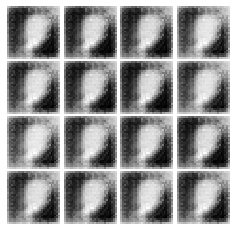

Epoch: 0, Iter: 40, D: 0.3384, G:2.109


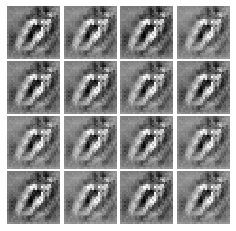

Epoch: 0, Iter: 60, D: 0.8124, G:2.208


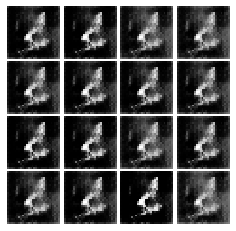

Epoch: 0, Iter: 80, D: 0.1695, G:4.009


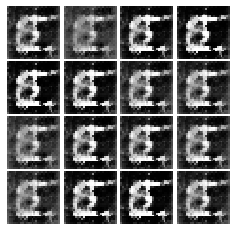

Epoch: 0, Iter: 100, D: 0.2449, G:2.874


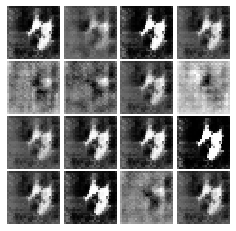

Epoch: 0, Iter: 120, D: 0.8733, G:2.124


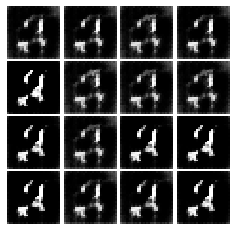

Epoch: 0, Iter: 140, D: 0.9946, G:2.048


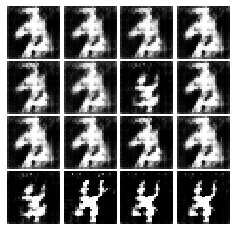

Epoch: 0, Iter: 160, D: 0.4047, G:4.274


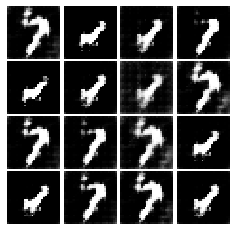

Epoch: 0, Iter: 180, D: 0.7219, G:2.019


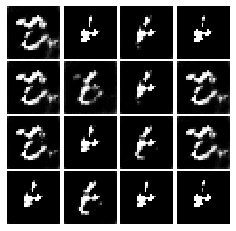

Epoch: 0, Iter: 200, D: 0.08274, G:4.003


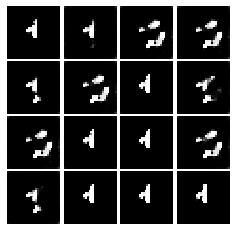

Epoch: 0, Iter: 220, D: 0.7603, G:2.699


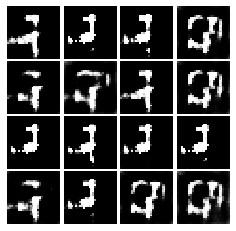

Epoch: 0, Iter: 240, D: 0.4993, G:3.508


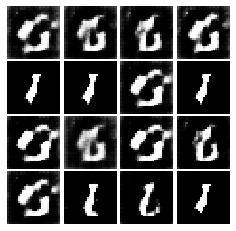

Epoch: 0, Iter: 260, D: 0.4884, G:4.057


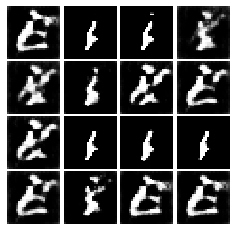

Epoch: 0, Iter: 280, D: 0.6134, G:3.384


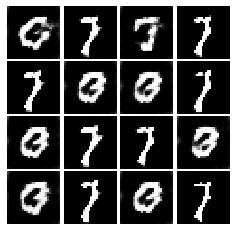

Epoch: 0, Iter: 300, D: 1.242, G:5.86


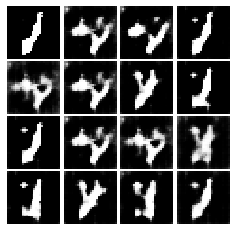

Epoch: 0, Iter: 320, D: 0.3098, G:3.156


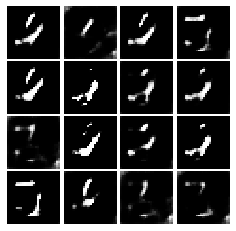

Epoch: 0, Iter: 340, D: 0.2566, G:3.555


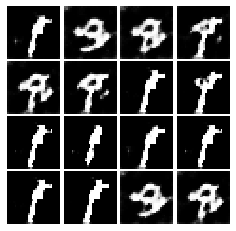

Epoch: 0, Iter: 360, D: 1.342, G:5.561


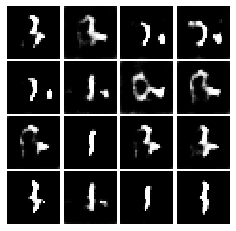

Epoch: 0, Iter: 380, D: 0.6142, G:2.64


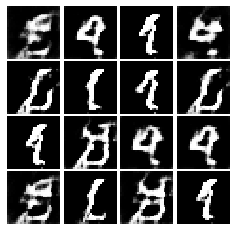

Epoch: 0, Iter: 400, D: 0.9141, G:1.402


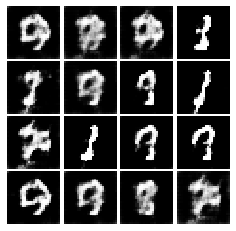

Epoch: 0, Iter: 420, D: 0.4117, G:2.412


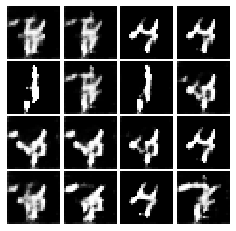

Epoch: 0, Iter: 440, D: 0.7832, G:6.841


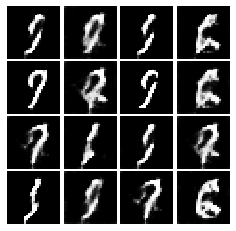

Epoch: 0, Iter: 460, D: 0.4917, G:2.209


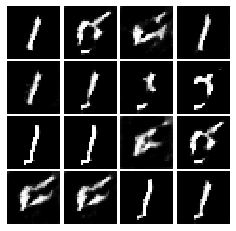

Epoch: 1, Iter: 480, D: 0.5613, G:2.763


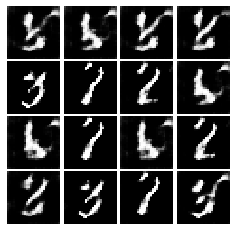

Epoch: 1, Iter: 500, D: 0.9564, G:2.039


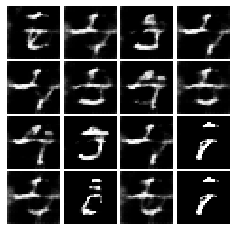

Epoch: 1, Iter: 520, D: 0.1997, G:3.219


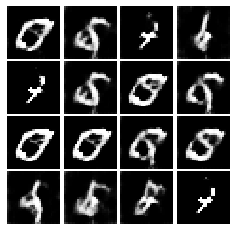

Epoch: 1, Iter: 540, D: 0.5729, G:2.366


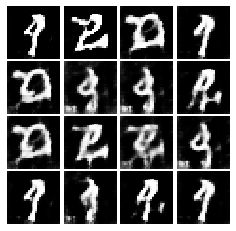

Epoch: 1, Iter: 560, D: 0.5099, G:2.835


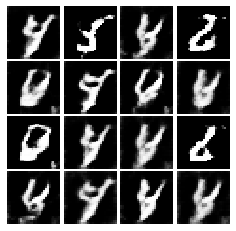

Epoch: 1, Iter: 580, D: 0.5461, G:2.689


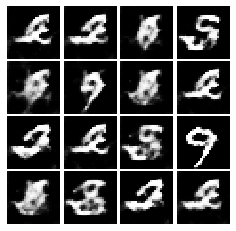

Epoch: 1, Iter: 600, D: 1.051, G:3.466


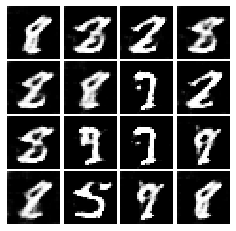

Epoch: 1, Iter: 620, D: 0.6407, G:2.437


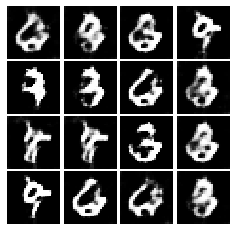

Epoch: 1, Iter: 640, D: 0.5856, G:1.6


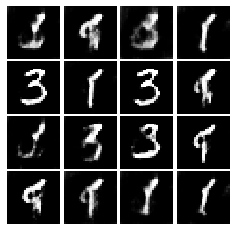

Epoch: 1, Iter: 660, D: 0.7988, G:5.267


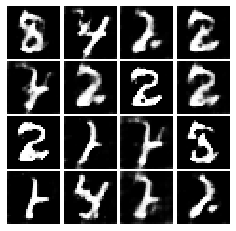

Epoch: 1, Iter: 680, D: 0.6491, G:1.773


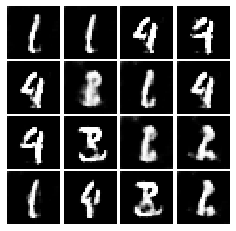

Epoch: 1, Iter: 700, D: 0.497, G:2.592


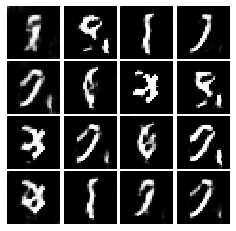

Epoch: 1, Iter: 720, D: 0.3721, G:3.624


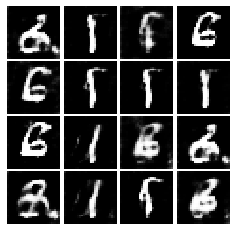

Epoch: 1, Iter: 740, D: 0.5858, G:2.764


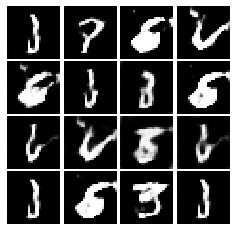

Epoch: 1, Iter: 760, D: 0.3336, G:2.801


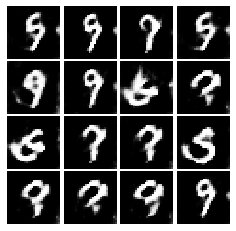

Epoch: 1, Iter: 780, D: 0.3547, G:3.196


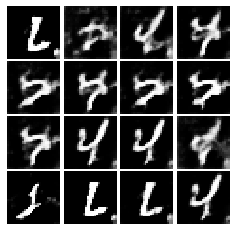

Epoch: 1, Iter: 800, D: 0.8457, G:3.176


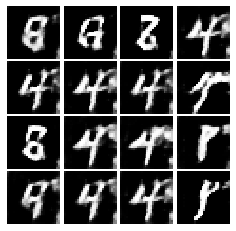

Epoch: 1, Iter: 820, D: 0.6585, G:3.101


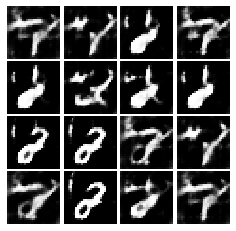

Epoch: 1, Iter: 840, D: 0.5691, G:2.77


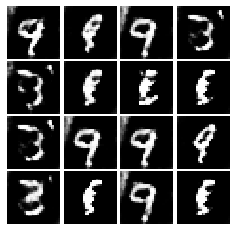

Epoch: 1, Iter: 860, D: 0.6486, G:3.917


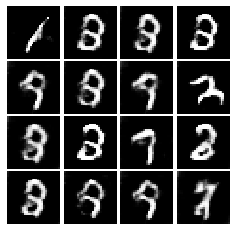

Epoch: 1, Iter: 880, D: 0.2914, G:3.084


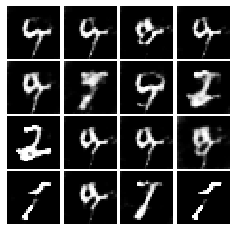

Epoch: 1, Iter: 900, D: 0.7064, G:3.075


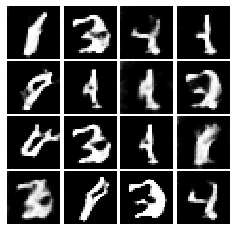

Epoch: 1, Iter: 920, D: 0.5345, G:3.402


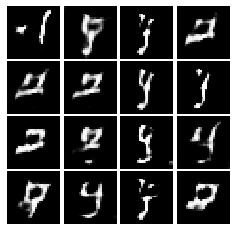

Epoch: 2, Iter: 940, D: 0.5788, G:2.842


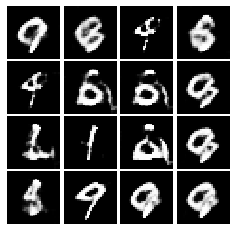

Epoch: 2, Iter: 960, D: 0.56, G:2.423


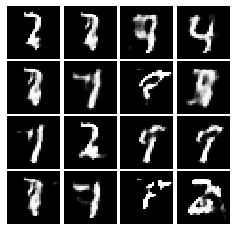

Epoch: 2, Iter: 980, D: 0.2602, G:2.816


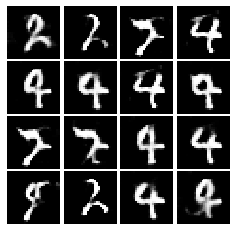

Epoch: 2, Iter: 1000, D: 0.3917, G:2.852


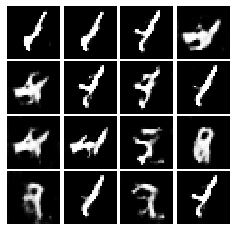

Epoch: 2, Iter: 1020, D: 0.4263, G:2.285


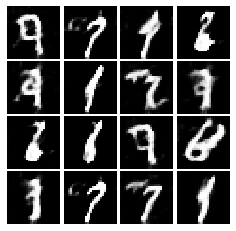

Epoch: 2, Iter: 1040, D: 0.626, G:3.002


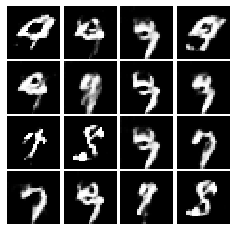

Epoch: 2, Iter: 1060, D: 0.358, G:3.205


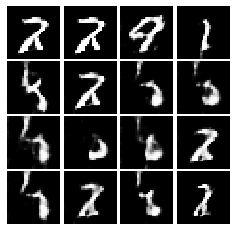

Epoch: 2, Iter: 1080, D: 0.814, G:1.514


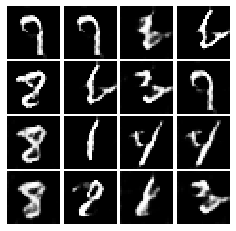

Epoch: 2, Iter: 1100, D: 0.4083, G:2.729


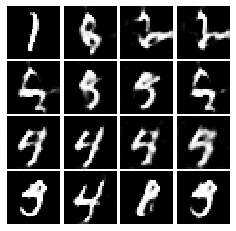

Epoch: 2, Iter: 1120, D: 0.5849, G:3.021


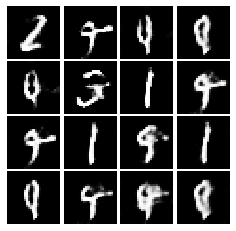

Epoch: 2, Iter: 1140, D: 0.6365, G:4.418


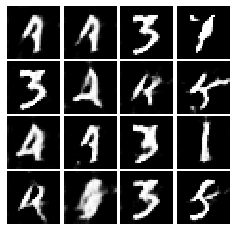

Epoch: 2, Iter: 1160, D: 0.639, G:1.901


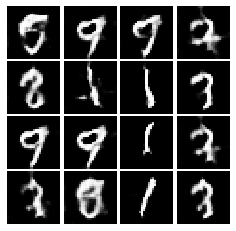

Epoch: 2, Iter: 1180, D: 0.6332, G:3.643


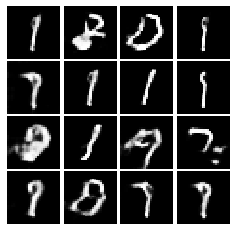

Epoch: 2, Iter: 1200, D: 0.6157, G:2.721


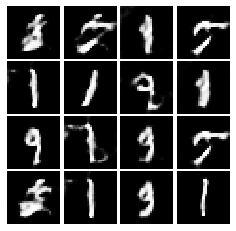

Epoch: 2, Iter: 1220, D: 0.578, G:1.573


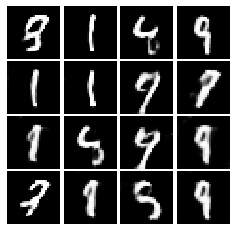

Epoch: 2, Iter: 1240, D: 0.4177, G:2.62


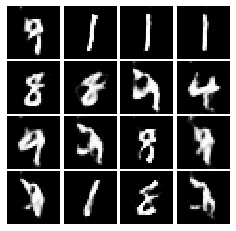

Epoch: 2, Iter: 1260, D: 0.5023, G:2.474


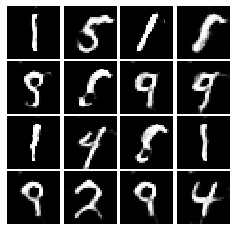

Epoch: 2, Iter: 1280, D: 0.8425, G:2.569


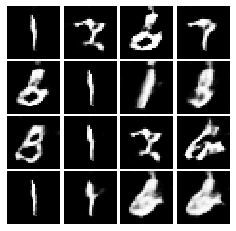

Epoch: 2, Iter: 1300, D: 0.4576, G:2.052


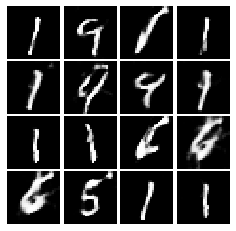

Epoch: 2, Iter: 1320, D: 0.7305, G:3.437


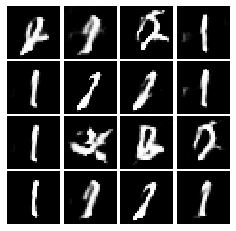

Epoch: 2, Iter: 1340, D: 0.6969, G:2.359


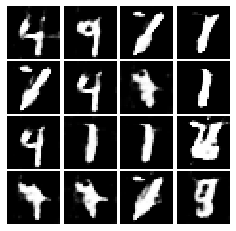

Epoch: 2, Iter: 1360, D: 0.7809, G:1.812


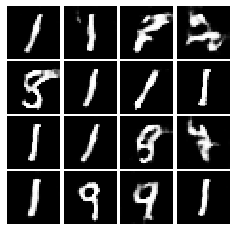

Epoch: 2, Iter: 1380, D: 0.5288, G:1.726


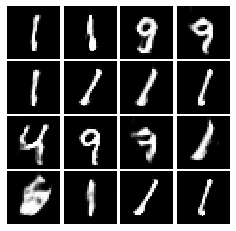

Epoch: 2, Iter: 1400, D: 0.4768, G:2.298


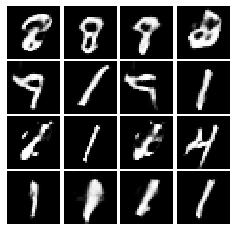

Epoch: 3, Iter: 1420, D: 0.4961, G:2.401


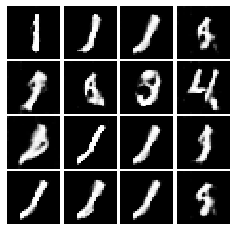

Epoch: 3, Iter: 1440, D: 0.3811, G:3.148


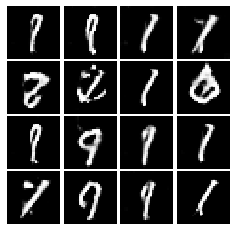

Epoch: 3, Iter: 1460, D: 0.5346, G:2.316


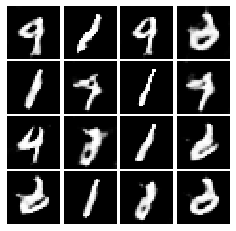

Epoch: 3, Iter: 1480, D: 0.5564, G:2.316


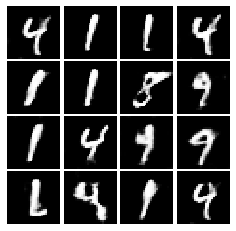

Epoch: 3, Iter: 1500, D: 0.5473, G:2.587


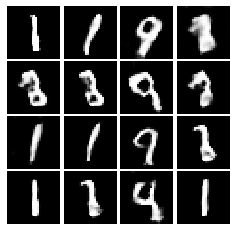

Epoch: 3, Iter: 1520, D: 0.5556, G:2.396


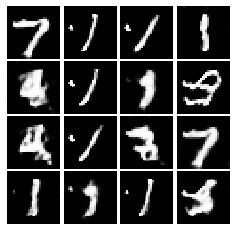

Epoch: 3, Iter: 1540, D: 0.5216, G:1.903


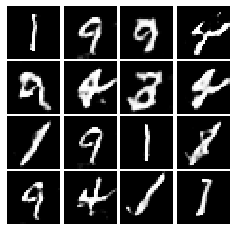

Epoch: 3, Iter: 1560, D: 0.5651, G:2.051


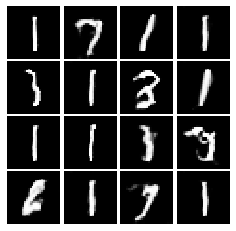

Epoch: 3, Iter: 1580, D: 0.4481, G:1.891


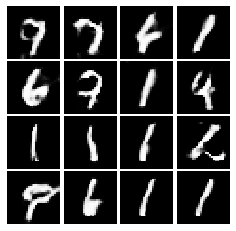

Epoch: 3, Iter: 1600, D: 0.6873, G:1.76


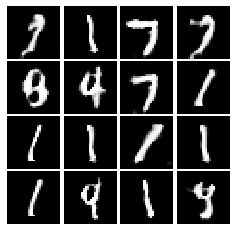

Epoch: 3, Iter: 1620, D: 0.5005, G:2.072


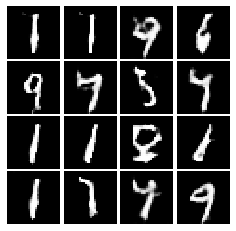

Epoch: 3, Iter: 1640, D: 0.5671, G:2.285


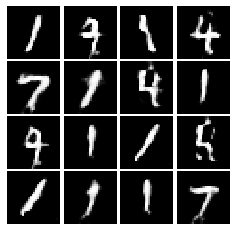

Epoch: 3, Iter: 1660, D: 0.6066, G:2.532


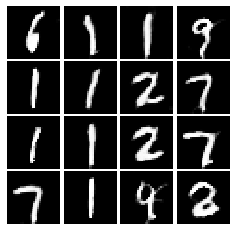

Epoch: 3, Iter: 1680, D: 0.5609, G:1.626


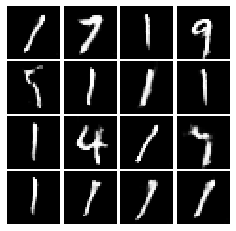

Epoch: 3, Iter: 1700, D: 0.4982, G:2.086


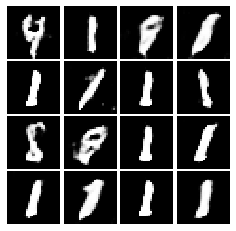

Epoch: 3, Iter: 1720, D: 0.6906, G:2.454


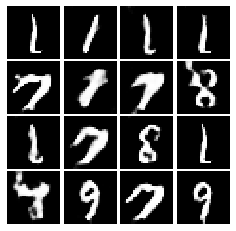

Epoch: 3, Iter: 1740, D: 0.6115, G:1.867


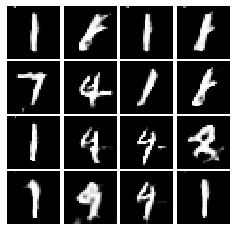

Epoch: 3, Iter: 1760, D: 0.6027, G:1.968


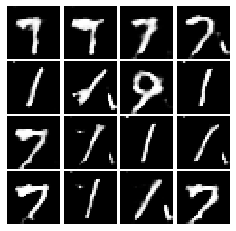

Epoch: 3, Iter: 1780, D: 0.5424, G:1.622


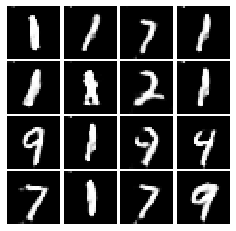

Epoch: 3, Iter: 1800, D: 0.7264, G:2.061


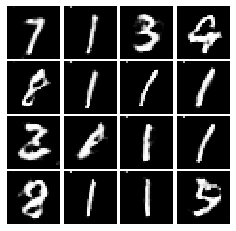

Epoch: 3, Iter: 1820, D: 0.7181, G:2.197


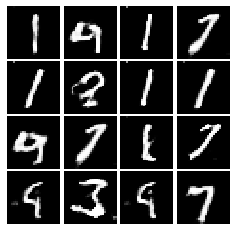

Epoch: 3, Iter: 1840, D: 0.6533, G:1.533


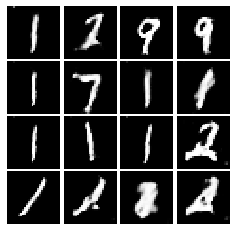

Epoch: 3, Iter: 1860, D: 0.5863, G:1.856


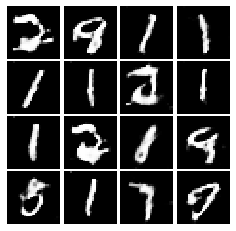

Epoch: 4, Iter: 1880, D: 0.4674, G:1.912


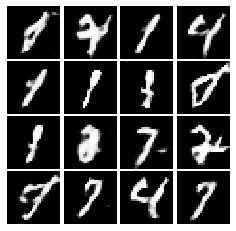

Epoch: 4, Iter: 1900, D: 0.4252, G:2.134


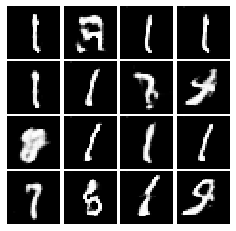

Epoch: 4, Iter: 1920, D: 0.5451, G:2.149


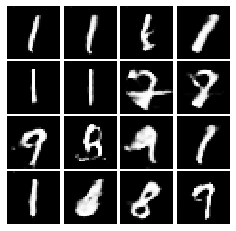

Epoch: 4, Iter: 1940, D: 0.4355, G:2.035


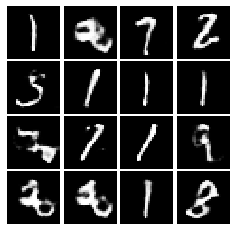

Epoch: 4, Iter: 1960, D: 0.5362, G:1.687


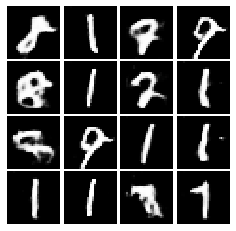

Epoch: 4, Iter: 1980, D: 0.4555, G:2.819


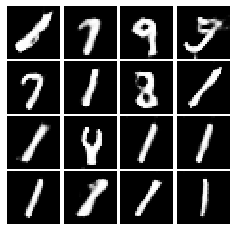

Epoch: 4, Iter: 2000, D: 0.7809, G:1.712


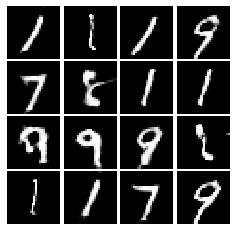

Epoch: 4, Iter: 2020, D: 0.653, G:2.329


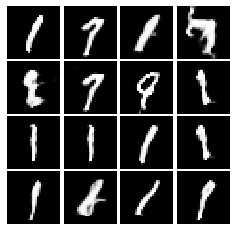

Epoch: 4, Iter: 2040, D: 0.6891, G:1.67


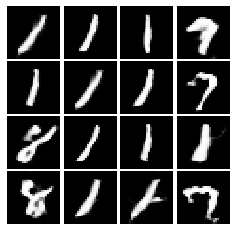

Epoch: 4, Iter: 2060, D: 0.4436, G:1.824


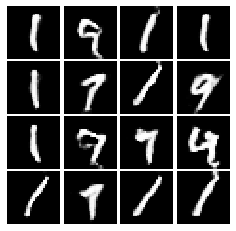

Epoch: 4, Iter: 2080, D: 0.6557, G:1.79


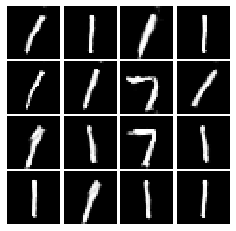

Epoch: 4, Iter: 2100, D: 0.5474, G:1.742


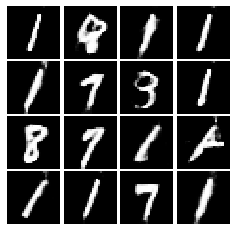

Epoch: 4, Iter: 2120, D: 0.5976, G:1.925


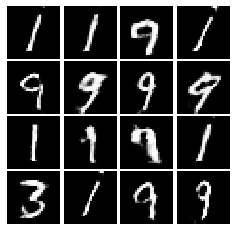

Epoch: 4, Iter: 2140, D: 0.6848, G:1.825


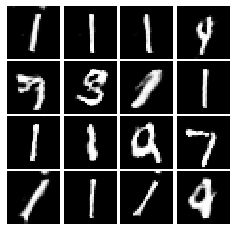

Epoch: 4, Iter: 2160, D: 1.023, G:1.219


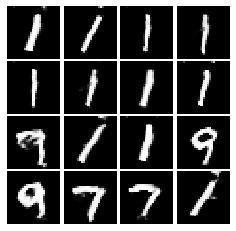

Epoch: 4, Iter: 2180, D: 0.5772, G:1.844


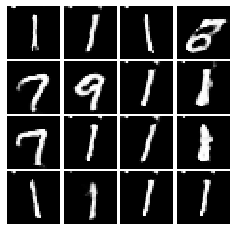

Epoch: 4, Iter: 2200, D: 0.5467, G:2.26


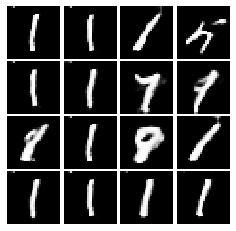

Epoch: 4, Iter: 2220, D: 0.4954, G:2.253


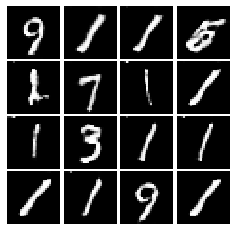

Epoch: 4, Iter: 2240, D: 0.5683, G:1.757


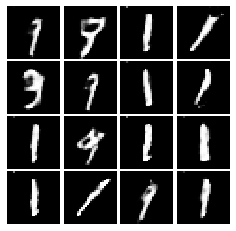

Epoch: 4, Iter: 2260, D: 0.4461, G:2.796


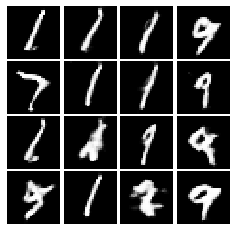

Epoch: 4, Iter: 2280, D: 0.5411, G:2.012


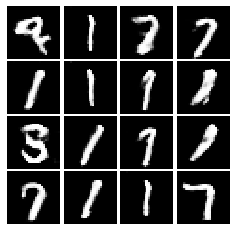

Epoch: 4, Iter: 2300, D: 0.5182, G:2.054


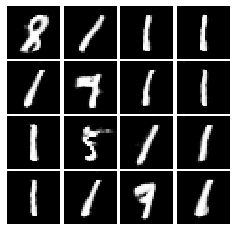

Epoch: 4, Iter: 2320, D: 0.5245, G:2.617


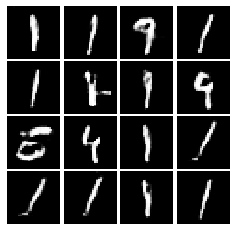

Epoch: 4, Iter: 2340, D: 0.6921, G:2.239


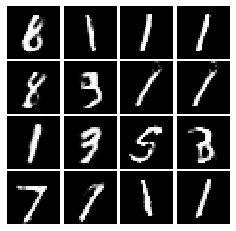

Final images


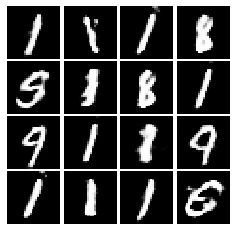

In [23]:
# Make the discriminator
D = discriminator()

# Make the generator
G = generator()

# Use the function you wrote earlier to get optimizers for the Discriminator and the Generator
D_solver, G_solver = get_solvers()

# Run it!
run_a_gan(D, G, D_solver, G_solver, discriminator_loss, generator_loss, num_epochs=5)

## INLINE QUESTION 1

We will look at an example to see why alternating minimization of the same objective (like in a GAN) can be tricky business.

Consider $f(x,y)=xy$. What does $\min_x\max_y f(x,y)$ evaluate to? (Hint: minmax tries to minimize the maximum value achievable.)

Now try to evaluate this function numerically for 6 steps, starting at the point $(1,1)$, 
by using alternating gradient (first updating y, then updating x using that updated y) with step size $1$. **Here step size is the learning_rate, and steps will be learning_rate * gradient.**
You'll find that writing out the update step in terms of $x_t,y_t,x_{t+1},y_{t+1}$ will be useful.

Breifly explain what $\min_x\max_y f(x,y)$ evaluates to and record the six pairs of explicit values for $(x_t,y_t)$ in the table below.

### Your answer:
 
 $y_0$ | $y_1$ | $y_2$ | $y_3$ | $y_4$ | $y_5$ | $y_6$ 
 ----- | ----- | ----- | ----- | ----- | ----- | ----- 
   1   |       |       |       |       |       |       
 $x_0$ | $x_1$ | $x_2$ | $x_3$ | $x_4$ | $x_5$ | $x_6$ 
   1   |       |       |       |       |       |       
   


## INLINE QUESTION 2
Using this method, will we ever reach the optimal value? Why or why not?

### Your answer: 


## INLINE QUESTION 3
If the generator loss decreases during training while the discriminator loss stays at a constant high value from the start, is this a good sign? Why or why not? A qualitative answer is sufficient.

### Your answer: 
